In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import yfinance
import yfinance as yf

import pandas_datareader as pdr
import pandas_datareader.data as web
import datetime

from sklearn.metrics import mean_absolute_error, mean_squared_error

import os
import warnings

warnings.filterwarnings("ignore")
# stock indices
# ^GSPC: S&P 500

# industrial materials
#  BZ=F: crude oil
#  NG=F: natural gas

# economic indices
#  GC=F: Gold price
#  EURUSD=X:  Euro/USD exchange rate

# other
#  ^VIX: CBOE Volatility Index
#  ^IXIC: NASDAQ Composite


# tickers = ["^GSPC", 'AAPL', 'MSFT','GOOG','GOOGL','TSLA','AMZN','BRK-A','BRK-B','NVDA','META','UNH','BZ=F','NG=F', 'GC=F', 'EURUSD=X','^VIX','^IXIC']

# stock_data = yfinance.download(tickers, start='2012-01-01', end="2023-04-23")
# stock_data = stock_data['Close']


# for i in stock_data.columns:
#     stock_data[i].fillna(method='ffill', inplace=True)
    
# stock_data = stock_data.dropna()



# # ther alternative financial data such as the Federal Reserve Economic Data, Fama/French Data, World Bank Development Indicators, etc.

# # Effective Federal Funds Rate (EFFR), Daily
# # Gross Domestic Product (GDP), Quarterly
# # S&P/Case-Shiller U.S. National Home Price Index (CSUSHPISA): housing price, Monthly
# # CPIAUCSL, CPILFESL (Monthly)


# fred_labels = ['EFFR', 'CSUSHPISA', 'GDP', 'CPIAUCSL', 'CPILFESL']

# fred_data = web.DataReader(fred_labels, 'fred', datetime.datetime(2012, 1, 1),datetime.datetime(2023, 4, 30))

# for i in fred_data.columns:
#     fred_data[i].fillna(method='ffill', inplace=True)

# fred_data = fred_data.dropna()

# fred_data.index.names = ['Date']


# # Join
# data_df = stock_data.join(fred_data)

# for i in data_df.columns:
#     data_df[i].fillna(method='ffill', inplace=True)
    

# print(data_df.isnull().sum())

# data_df.head()

In [2]:
tickers = ["^GSPC", 'AAPL', 'MSFT','GOOG','GOOGL','TSLA','AMZN','BRK-A','BRK-B','NVDA','META','UNH','BZ=F','NG=F', 'GC=F', 'EURUSD=X','^VIX','^IXIC']

stock_data = yfinance.download(tickers, start='2012-01-01', end="2023-04-30")
stock_data = stock_data['Close']

for i in stock_data.columns:
     stock_data[i].fillna(method='ffill', inplace=True)
    
stock_data = stock_data.dropna()



# ther alternative financial data such as the Federal Reserve Economic Data, Fama/French Data, World Bank Development Indicators, etc.

# Effective Federal Funds Rate (EFFR), Daily
# Gross Domestic Product (GDP), Quarterly
# S&P/Case-Shiller U.S. National Home Price Index (CSUSHPISA): housing price, Monthly
# CPIAUCSL, CPILFESL (Monthly)


fred_labels = ['EFFR', 'CSUSHPISA', 'GDP', 'CPIAUCSL', 'CPILFESL']

fred_data = web.DataReader(fred_labels, 'fred', datetime.datetime(2012, 1, 1),datetime.datetime(2023, 4, 30))

for i in fred_data.columns:
    fred_data[i].fillna(method='ffill', inplace=True)

fred_data = fred_data.dropna()

fred_data.index.names = ['Date']


# Join
data_df = stock_data.join(fred_data)

for i in data_df.columns:
    data_df[i].fillna(method='ffill', inplace=True)
    

    
print(data_df.shape)
data_df = data_df.resample('D').ffill()
print(data_df.shape)
print(data_df.isnull().sum())

data_df.head()


[*********************100%***********************]  18 of 18 completed
(2851, 23)
(3991, 23)
AAPL         0
AMZN         0
BRK-A        0
BRK-B        0
BZ=F         0
EURUSD=X     0
GC=F         0
GOOG         0
GOOGL        0
META         0
MSFT         0
NG=F         0
NVDA         0
TSLA         0
UNH          0
^GSPC        0
^IXIC        0
^VIX         0
EFFR         0
CSUSHPISA    0
GDP          0
CPIAUCSL     0
CPILFESL     0
dtype: int64


,AAPL,AMZN,BRK-A,BRK-B,BZ=F,EURUSD=X,GC=F,GOOG,GOOGL,META,...,TSLA,UNH,^GSPC,^IXIC,^VIX,EFFR,CSUSHPISA,GDP,CPIAUCSL,CPILFESL
Date,,,,,,,,,,,,,,,,,,,,,
2012-05-18,18.942142,10.6925,119850.0,78.910004,107.139999,1.269841,1591.599976,14.953949,15.025025,38.230000,...,1.837333,53.990002,1295.219971,2778.790039,25.10,0.16,140.155,16207.13,228.713,229.224
2012-05-19,18.942142,10.6925,119850.0,78.910004,107.139999,1.269841,1591.599976,14.953949,15.025025,38.230000,...,1.837333,53.990002,1295.219971,2778.790039,25.10,0.16,140.155,16207.13,228.713,229.224
2012-05-20,18.942142,10.6925,119850.0,78.910004,107.139999,1.269841,1591.599976,14.953949,15.025025,38.230000,...,1.837333,53.990002,1295.219971,2778.790039,25.10,0.16,140.155,16207.13,228.713,229.224
2012-05-21,20.045713,10.9055,120220.0,79.800003,108.809998,1.277302,1588.400024,15.295419,15.368118,34.029999,...,1.918000,55.549999,1315.989990,2847.209961,22.01,0.16,140.155,16207.13,228.713,229.224
2012-05-22,19.891787,10.7665,120550.0,79.650002,108.410004,1.281066,1576.300049,14.963912,15.035035,31.000000,...,2.053333,55.720001,1316.630005,2839.080078,22.48,0.16,140.155,16207.13,228.713,229.224


In [4]:
print(data_df.index.max() - data_df.index.min())
print(data_df.shape)

3990 days 00:00:00
(3991, 23)


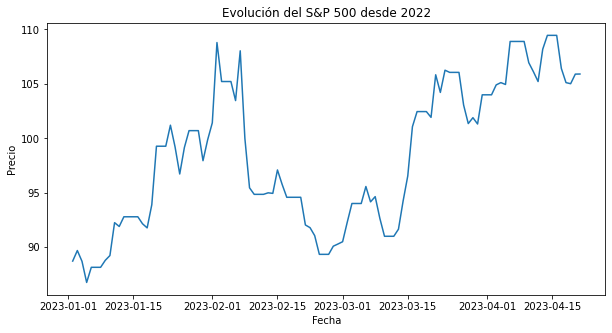

In [5]:

fig, ax = plt.subplots(1, 1, figsize=(10, 5))
_ = sns.lineplot(data=data_df[data_df.index > np.datetime64("2023-01-01")], x='Date', y='GOOG', ax=ax)
ax.set_ylabel("Precio")
ax.set_xlabel("Fecha")
_ = ax.set_title("Evolución del S&P 500 desde 2022")

### Exploratory data analysis

In [45]:
data_df.describe()

,AAPL,AMZN,BRK-A,BRK-B,BZ=F,EURUSD=X,GC=F,GOOG,GOOGL,META,...,TSLA,UNH,^GSPC,^IXIC,^VIX,EFFR,CSUSHPISA,GDP,CPIAUCSL,CPILFESL
count,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,...,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000,2851.000000
mean,62.525113,70.861414,280804.328657,186.808706,73.450986,1.171711,1463.575552,57.932247,58.105130,148.669165,...,71.872395,227.159646,2701.395430,7470.151484,17.884784,0.856261,204.641167,20205.748209,252.247415,257.176583
std,49.861596,53.113555,100422.625626,66.500245,24.697107,0.095914,262.951346,35.723296,35.224937,86.061459,...,100.581814,145.259346,919.421625,3583.644935,7.053334,1.100318,46.286168,2836.232404,19.624792,19.999315
min,13.947500,10.411000,118850.000000,78.830002,19.330000,0.959619,1050.800049,13.924059,13.990240,17.730000,...,1.740000,51.000000,1278.040039,2747.479980,9.140000,0.040000,140.155000,16207.130000,228.524000,229.224000
25%,25.185000,19.231750,204160.000000,136.065002,53.190001,1.104728,1249.800049,28.474796,28.918250,78.480000,...,13.905000,109.440002,1999.484985,4674.760010,13.190000,0.090000,169.132000,17991.348000,237.336000,240.172000
50%,39.682499,55.580002,271062.000000,180.339996,67.839996,1.141292,1331.500000,50.228001,50.549999,144.960007,...,18.439333,209.899994,2529.189941,6624.000000,15.960000,0.170000,195.955000,19636.731000,247.284000,253.816000
75%,97.498749,100.622749,330647.000000,220.500000,97.985001,1.228433,1728.399963,74.904999,75.181252,192.135002,...,99.991665,304.915009,3326.625000,10466.480469,20.825000,1.550000,219.426000,21704.706000,259.248000,267.352000
max,182.009995,186.570496,539180.000000,359.570007,127.980003,1.393088,2051.500000,150.709000,149.838501,382.179993,...,409.970001,555.150024,4796.560059,16057.440430,82.690002,4.830000,305.152000,26465.865000,301.808000,305.240000


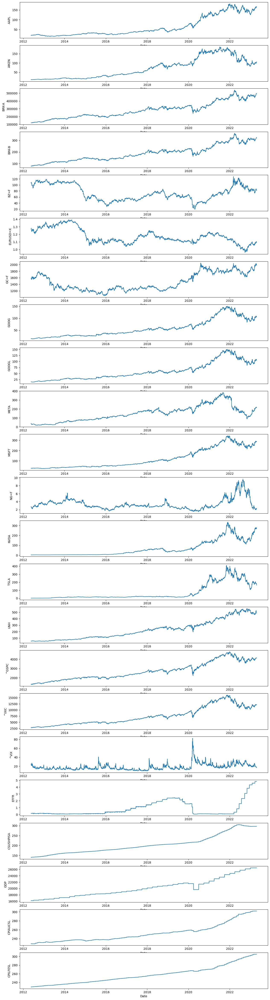

In [5]:
fig, ax = plt.subplots(data_df.columns.shape[0], 1, figsize=(15, 60))
for i,c in enumerate(data_df.columns):
    sns.lineplot(data=data_df, x='Date', y=c, ax=ax[i])

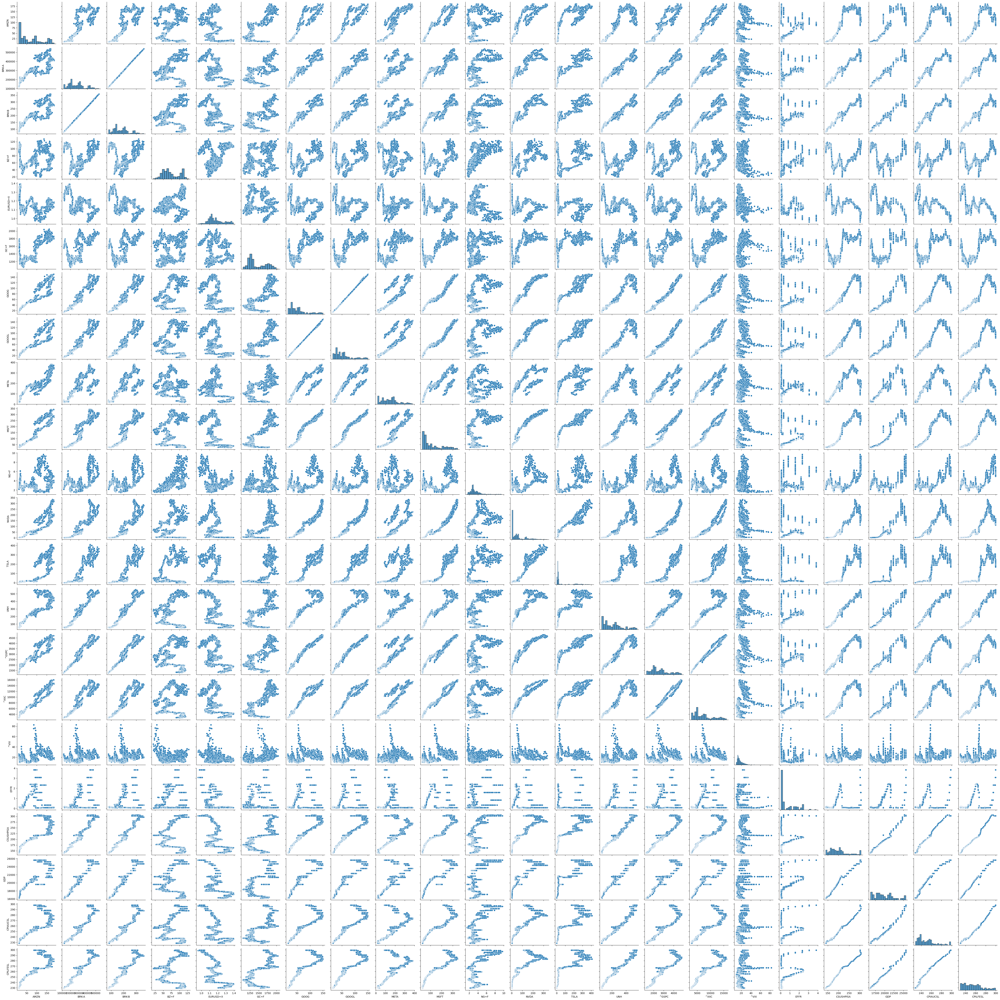

In [288]:
sns.pairplot(data_df)

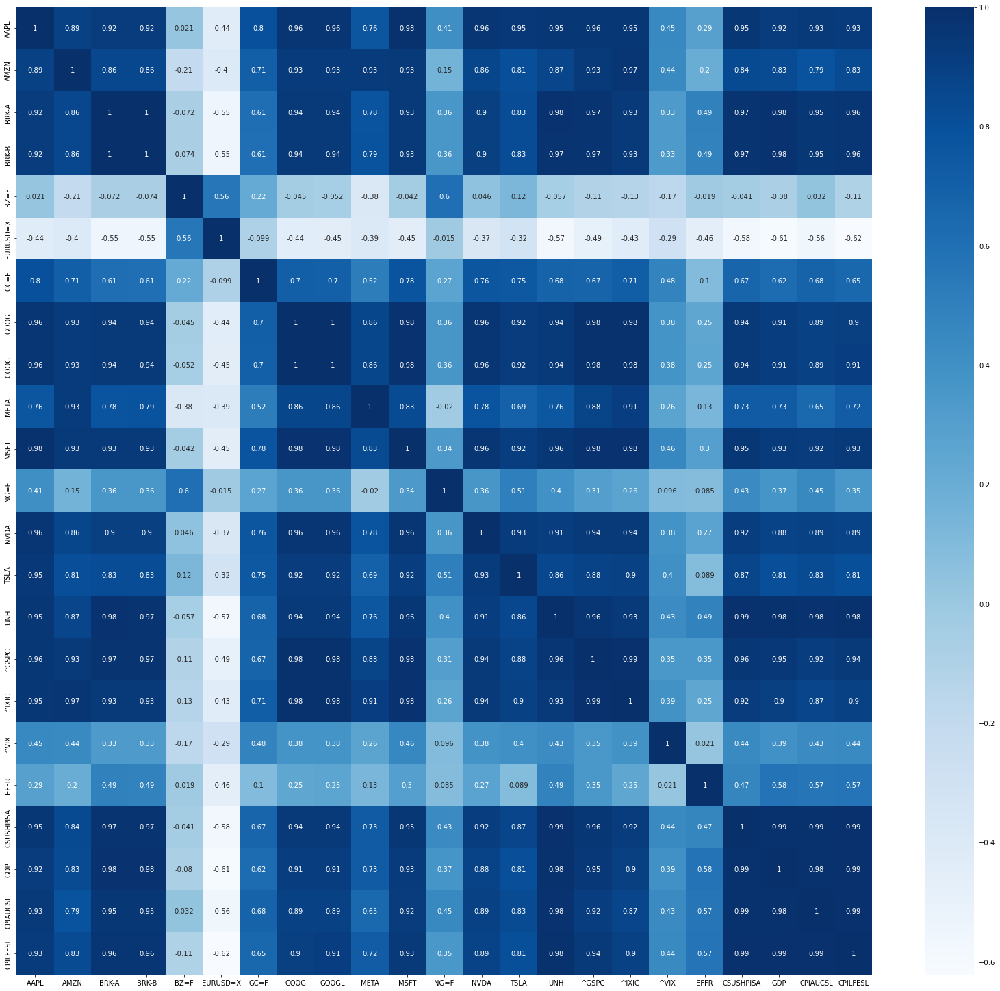

In [13]:
corr_df = data_df.corr(method='pearson')
plt.figure(figsize=(28, 26))
sns.heatmap(corr_df, annot=True, cmap="Blues")
plt.show()

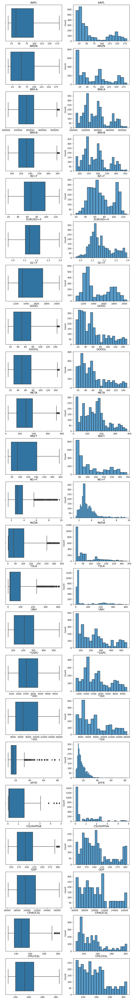

In [39]:
fig, ax = plt.subplots(data_df.columns.shape[0], 2, figsize=(10, 80))
for i,column in enumerate(data_df.columns):
    _ = sns.boxplot(x=data_df[column], ax=ax[i][0])
    _ = sns.histplot(data=data_df, x=column, ax=ax[i][1])
    _ = ax[i][0].set_title(f"{column}")
    _ = ax[i][1].set_title(f"{column}")
    _ = ax[i][0].set_xlabel("")
    _ = ax[i][1].set_xlabel("")

## Feature selection

In [3]:
label = "^GSPC"
predictors = ['AAPL', 'AMZN',  'GOOG',
       'GOOGL', 'META', 'MSFT', 'NVDA', 'TSLA', 'UNH','GC=F', 'EURUSD=X','^IXIC', 'CSUSHPISA', 'GDP', 'CPIAUCSL', 'CPILFESL']

In [4]:
## metrics

def mape_metric(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def smape_metric(y_true, y_pred):
    return np.mean(np.abs(y_pred - y_true) / ((np.abs(y_true) + np.abs(y_pred)) / 2)) * 100




# Models

* VAR
* prophet
* Vanilla LSTM
* Vanilla Transformer
* Custom LSTM models (state of the art?)
* Custom Transformer models (state of the art?)

### VAR

In [ ]:
# https://towardsdatascience.com/future-price-prediction-beyond-test-data-using-vector-auto-regression-eedb7e0c04e


In [139]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
input_scaler = StandardScaler()
label_scaler = StandardScaler()

# test - train split
df_train = data_df[data_df.index <= (data_df.index[-1] - datetime.timedelta(days=7))]
df_train['y'] = df_train[label]

df_test = data_df[data_df.index > (data_df.index[-1] - datetime.timedelta(days=7))]
df_test['y'] = df_test[label]

input_scaler.fit(df_train[predictors])
label_scaler.fit(df_train['y'].values.reshape(-1, 1))

df_train[predictors] = input_scaler.transform(df_train[predictors])
df_train['y'] = label_scaler.transform(df_train['y'].values.reshape(-1, 1))
df_train = df_train[['y'] + predictors]

df_test[predictors] = input_scaler.transform(df_test[predictors])
df_test['y'] = label_scaler.transform(df_test['y'].values.reshape(-1, 1))
df_test = df_test[['y'] + predictors]


In [141]:

from statsmodels.tsa.stattools import adfuller

def adfuller_test(series, signif=0.05, name='', verbose=False):
    r = adfuller(series, autolag='AIC')
    output = {'test_statistic':round(r[0], 4), 'pvalue':round(r[1], 4), 'n_lags':round(r[2], 4), 'n_obs':r[3]}
    p_value = output['pvalue']

    def adjust(val, length= 6): 
        return str(val).ljust(length)

    print(f'Augmented Dickey-Fuller Test on "{name}"', "\n   ", '-'*47)
    print(f'Null Hypothesis: Data has unit root. Non-Stationary.')
    print(f'Significance Level = {signif}')
    print(f'Test Statistic = {output["test_statistic"]}')
    print(f'No. Lags Chosen = {output["n_lags"]}')
    for key,val in r[4].items():
        print(f' Critical value {adjust(key)} = {round(val, 3)}')
        if p_value <= signif:
            print(f" => P-Value = {p_value}. Rejecting Null Hypothesis.")
            print(f" => Series is Stationary.")
        else:
            print(f" => P-Value = {p_value}. Weak evidence to reject the   Null Hypothesis.")
            print(f" => Series is Non-Stationary.")

# ADF test on each column
for name, column in df_train.iteritems():
    adfuller_test(column, name = column.name)

Augmented Dickey-Fuller Test on "y" 
    -----------------------------------------------
Null Hypothesis: Data has unit root. Non-Stationary.
Significance Level = 0.05
Test Statistic = -0.8152
No. Lags Chosen = 20
 Critical value 1%     = -3.432
 => P-Value = 0.8146. Weak evidence to reject the   Null Hypothesis.
 => Series is Non-Stationary.
 Critical value 5%     = -2.862
 => P-Value = 0.8146. Weak evidence to reject the   Null Hypothesis.
 => Series is Non-Stationary.
 Critical value 10%    = -2.567
 => P-Value = 0.8146. Weak evidence to reject the   Null Hypothesis.
 => Series is Non-Stationary.
Augmented Dickey-Fuller Test on "AAPL" 
    -----------------------------------------------
Null Hypothesis: Data has unit root. Non-Stationary.
Significance Level = 0.05
Test Statistic = 0.2012
No. Lags Chosen = 25
 Critical value 1%     = -3.432
 => P-Value = 0.9723. Weak evidence to reject the   Null Hypothesis.
 => Series is Non-Stationary.
 Critical value 5%     = -2.862
 => P-Value = 

Glimpse of differenced data:
                   y      AAPL      AMZN      GOOG     GOOGL      META  \
Date                                                                     
2012-05-19  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
2012-05-20  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
2012-05-21  0.022627  0.022221  0.004011  0.009567  0.009749 -0.048807   
2012-05-22  0.000697 -0.003099 -0.002618 -0.009288 -0.009464 -0.035211   
2012-05-23  0.002429  0.009773  0.001836  0.006043  0.006158  0.011621   

                MSFT      NVDA      TSLA       UNH      GC=F  EURUSD=X  \
Date                                                                     
2012-05-19  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
2012-05-20  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
2012-05-21  0.005244  0.000686  0.000803  0.010767 -0.012214  0.077808   
2012-05-22  0.000109 -0.000490  0.001348  0.001173 -0.046186  0.039247   
2012-05-

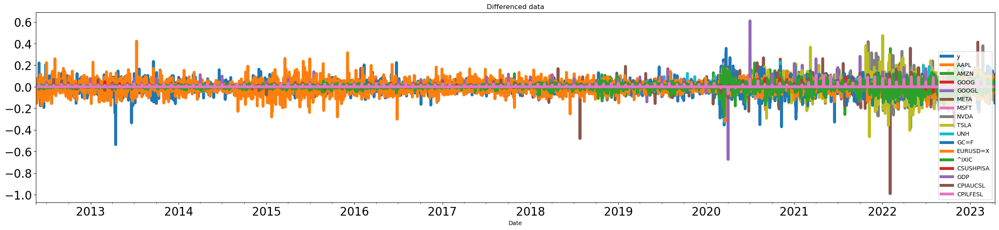

In [142]:
# 1st order difference 
# differenced train data
data_diff = df_train.diff()
data_diff.dropna(inplace=True)
print('Glimpse of differenced data:')
print(data_diff.head())
# plotting differenced data
data_diff.plot(figsize=(30,6), linewidth=5, fontsize=20)
plt.title('Differenced data')
plt.show()


In [143]:
for name, column in data_diff.iteritems():
    adfuller_test(column, name=column.name)

Augmented Dickey-Fuller Test on "y" 
    -----------------------------------------------
Null Hypothesis: Data has unit root. Non-Stationary.
Significance Level = 0.05
Test Statistic = -14.0429
No. Lags Chosen = 19
 Critical value 1%     = -3.432
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
 Critical value 5%     = -2.862
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
 Critical value 10%    = -2.567
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
Augmented Dickey-Fuller Test on "AAPL" 
    -----------------------------------------------
Null Hypothesis: Data has unit root. Non-Stationary.
Significance Level = 0.05
Test Statistic = -11.3486
No. Lags Chosen = 24
 Critical value 1%     = -3.432
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
 Critical value 5%     = -2.862
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.
 Critical value 10%    = -2.567
 => P-Value = 0

In [146]:
from statsmodels.tsa.vector_ar.var_model import VAR

order=30

var_model = VAR(data_diff)
res = var_model.select_order(maxlags=order)
print(res.summary())
results = var_model.fit(maxlags=order, ic='aic')
print(results.summary())

 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0       -141.9     -141.9*   2.301e-62     -141.9*
1       -142.1      -141.6   1.982e-62      -141.9
2       -142.1      -141.2   1.903e-62      -141.8
3       -142.1      -140.7   1.900e-62      -141.6
4       -142.1      -140.2   1.969e-62      -141.4
5       -142.1      -139.8   1.875e-62      -141.3
6       -142.2      -139.4   1.827e-62      -141.2
7       -142.2      -139.0   1.717e-62      -141.1
8       -142.2      -138.5   1.674e-62      -140.9
9       -142.2      -138.1   1.704e-62      -140.8
10      -142.2      -137.6   1.755e-62      -140.6
11      -142.2      -137.1   1.801e-62      -140.4
12      -142.2      -136.6   1.841e-62      -140.2
13      -142.2      -136.2   1.842e-62      -140.0
14      -142.2      -135.8   1.706e-62      -139.9
15      -142.2      -135.3   1.678e-62      -139.8
16      -142.3      -134.9   1.

In [147]:
# make predictions
pred, lower, upper= results.forecast_interval(data_diff.values[-order:], steps=7, alpha=0.05)
pred = pd.DataFrame(pred, columns = df_train.columns+ '_pred')
lower = pd.DataFrame(lower, columns = df_train.columns+ '_pred')
upper = pd.DataFrame(upper, columns = df_train.columns+ '_pred')
pred

,y_pred,AAPL_pred,AMZN_pred,GOOG_pred,GOOGL_pred,META_pred,MSFT_pred,NVDA_pred,TSLA_pred,UNH_pred,GC=F_pred,EURUSD=X_pred,^IXIC_pred,CSUSHPISA_pred,GDP_pred,CPIAUCSL_pred,CPILFESL_pred
0,0.001863,0.004636,0.044838,0.010229,0.006601,0.001562,0.008260,0.015650,-0.005745,-0.011584,-0.019696,-0.030674,0.006620,-0.002552,0.004980,-0.000867,-0.001892
1,0.020549,-0.005476,0.016094,0.026042,0.028257,0.036976,-0.001355,0.026129,-0.012546,-0.007140,0.044924,0.016778,0.012243,-0.006005,0.009809,-0.001831,0.001720
2,0.007026,0.006192,-0.006787,0.001884,0.002412,0.018345,-0.012072,0.007231,0.064381,-0.016910,-0.035886,-0.004742,0.008323,0.001419,0.008326,0.006542,0.006992
3,-0.026405,-0.025494,-0.049427,-0.037064,-0.033583,-0.000337,-0.038306,-0.056110,0.009715,-0.014753,-0.012714,-0.023488,-0.023272,0.013630,-0.013669,0.013945,0.010697
4,0.031925,0.034926,0.036302,0.040173,0.037699,0.018984,0.018687,0.030692,-0.006595,0.005256,-0.011727,-0.033798,0.024274,0.005350,0.021779,0.000180,0.001947
5,0.006327,0.012470,-0.028922,-0.022130,-0.018794,-0.041037,0.004729,-0.004042,0.024153,0.018556,-0.003445,0.009841,0.001700,-0.005246,-0.009441,-0.002312,0.000074
6,-0.019494,-0.005815,0.011902,-0.032502,-0.033499,0.022301,-0.026782,-0.033172,0.008221,-0.007602,0.026759,0.035574,-0.012443,-0.005492,0.005754,-0.001129,-0.002105


In [148]:
lower

,y_pred,AAPL_pred,AMZN_pred,GOOG_pred,GOOGL_pred,META_pred,MSFT_pred,NVDA_pred,TSLA_pred,UNH_pred,GC=F_pred,EURUSD=X_pred,^IXIC_pred,CSUSHPISA_pred,GDP_pred,CPIAUCSL_pred,CPILFESL_pred
0,-0.051105,-0.041525,-0.007641,-0.042966,-0.047381,-0.071492,-0.036031,-0.047825,-0.075119,-0.055573,-0.109299,-0.128166,-0.042201,-0.014669,-0.027985,-0.016325,-0.014027
1,-0.032937,-0.051928,-0.036966,-0.027594,-0.026192,-0.036649,-0.046085,-0.037997,-0.082232,-0.051476,-0.045128,-0.083882,-0.037038,-0.018252,-0.023338,-0.017395,-0.010495
2,-0.046662,-0.040539,-0.060343,-0.052038,-0.052359,-0.055914,-0.057069,-0.057304,-0.005816,-0.061597,-0.126110,-0.105737,-0.041217,-0.010853,-0.024904,-0.009054,-0.005263
3,-0.080315,-0.072467,-0.103263,-0.091290,-0.088622,-0.075212,-0.083529,-0.121039,-0.061025,-0.059659,-0.103206,-0.125267,-0.073048,0.001265,-0.047043,-0.001748,-0.001619
4,-0.022203,-0.012301,-0.017916,-0.014189,-0.017485,-0.056166,-0.026804,-0.034484,-0.077767,-0.039749,-0.102535,-0.135789,-0.025725,-0.007124,-0.011650,-0.015625,-0.010447
5,-0.048064,-0.034943,-0.083321,-0.076764,-0.074251,-0.116581,-0.041082,-0.069453,-0.047406,-0.026731,-0.094595,-0.092351,-0.048549,-0.017959,-0.042993,-0.018307,-0.012442
6,-0.074109,-0.053595,-0.042859,-0.087506,-0.089333,-0.053488,-0.072904,-0.099100,-0.064341,-0.053045,-0.064599,-0.066854,-0.063005,-0.018247,-0.027847,-0.017181,-0.014675


In [149]:
upper

,y_pred,AAPL_pred,AMZN_pred,GOOG_pred,GOOGL_pred,META_pred,MSFT_pred,NVDA_pred,TSLA_pred,UNH_pred,GC=F_pred,EURUSD=X_pred,^IXIC_pred,CSUSHPISA_pred,GDP_pred,CPIAUCSL_pred,CPILFESL_pred
0,0.054832,0.050798,0.097318,0.063425,0.060582,0.074616,0.052552,0.079125,0.063630,0.032405,0.069907,0.066817,0.055440,0.009565,0.037945,0.014591,0.010242
1,0.074034,0.040977,0.069155,0.079679,0.082705,0.110602,0.043375,0.090256,0.057139,0.037197,0.134975,0.117437,0.061524,0.006242,0.042956,0.013734,0.013935
2,0.060713,0.052924,0.046769,0.055805,0.057182,0.092605,0.032925,0.071766,0.134578,0.027778,0.054338,0.096254,0.057863,0.013690,0.041557,0.022138,0.019248
3,0.027505,0.021480,0.004409,0.017161,0.021457,0.074538,0.006916,0.008820,0.080456,0.030152,0.077777,0.078291,0.026503,0.025996,0.019705,0.029637,0.023013
4,0.086052,0.082153,0.090520,0.094535,0.092883,0.094134,0.064178,0.095868,0.064576,0.050262,0.079081,0.068194,0.074272,0.017824,0.055208,0.015985,0.014341
5,0.060719,0.059883,0.025477,0.032503,0.036663,0.034507,0.050541,0.061368,0.095712,0.063843,0.087704,0.112033,0.051948,0.007467,0.024111,0.013683,0.012590
6,0.035121,0.041965,0.066664,0.022501,0.022336,0.098090,0.019340,0.032756,0.080783,0.037841,0.118116,0.138001,0.038119,0.007263,0.039355,0.014923,0.010464


In [150]:
def invert_transformation(data_diff, pred):
    forecast = pred.copy()
    columns = df_train.columns
    for col in columns:
        forecast[str(col)+'_pred'] = df_train[col].iloc[-1] +   forecast[str(col) +'_pred'].cumsum()
    return forecast

output = invert_transformation(data_diff, pred)
output.index = df_test.index

output_lower = invert_transformation(data_diff, lower)
output_lower.index = df_test.index

output_upper = invert_transformation(data_diff, upper)
output_upper.index = df_test.index

In [160]:
## metrics

for col in df_test.columns:
    print(col, ":")
    
    mae = mean_absolute_error(df_test['y'], output['y_pred'])
    mse = mean_squared_error(df_test['y'], output['y_pred'])
    rmse = mean_squared_error(df_test['y'], output['y_pred'], squared=False)

    mape = mape_metric(df_test['y'], output['y_pred'])
    smape = smape_metric(df_test['y'], output['y_pred'])

    print("MAPE:", mape)
    print("SMAPE:", smape)
    print(f"MAE: {mae}")
    print(f"MSE: {mse}")
    print(f"RMSE: {rmse}")
    print("\n")


y :
MAPE: 1.3397822479346404
SMAPE: 1.3284752230333248
MAE: 0.021032901404864024
MSE: 0.0006304839567504361
RMSE: 0.025109439594511784


AAPL :
MAPE: 1.3397822479346404
SMAPE: 1.3284752230333248
MAE: 0.021032901404864024
MSE: 0.0006304839567504361
RMSE: 0.025109439594511784


AMZN :
MAPE: 1.3397822479346404
SMAPE: 1.3284752230333248
MAE: 0.021032901404864024
MSE: 0.0006304839567504361
RMSE: 0.025109439594511784


GOOG :
MAPE: 1.3397822479346404
SMAPE: 1.3284752230333248
MAE: 0.021032901404864024
MSE: 0.0006304839567504361
RMSE: 0.025109439594511784


GOOGL :
MAPE: 1.3397822479346404
SMAPE: 1.3284752230333248
MAE: 0.021032901404864024
MSE: 0.0006304839567504361
RMSE: 0.025109439594511784


META :
MAPE: 1.3397822479346404
SMAPE: 1.3284752230333248
MAE: 0.021032901404864024
MSE: 0.0006304839567504361
RMSE: 0.025109439594511784


MSFT :
MAPE: 1.3397822479346404
SMAPE: 1.3284752230333248
MAE: 0.021032901404864024
MSE: 0.0006304839567504361
RMSE: 0.025109439594511784


NVDA :
MAPE: 1.3397822

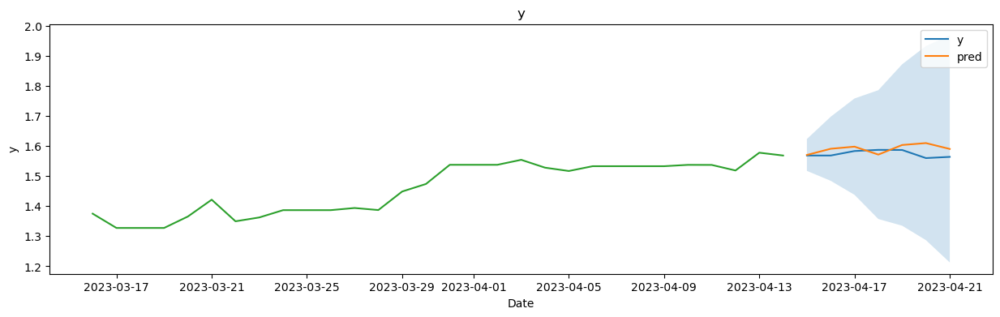

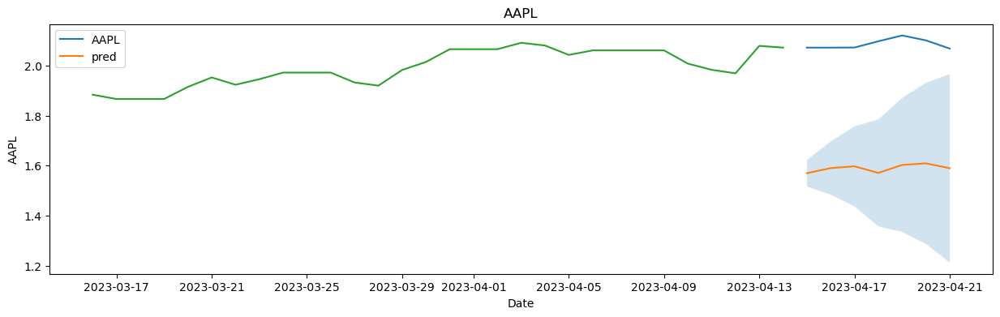

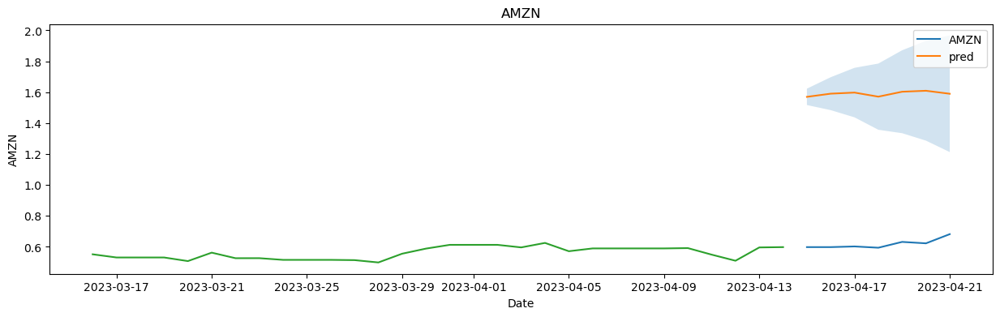

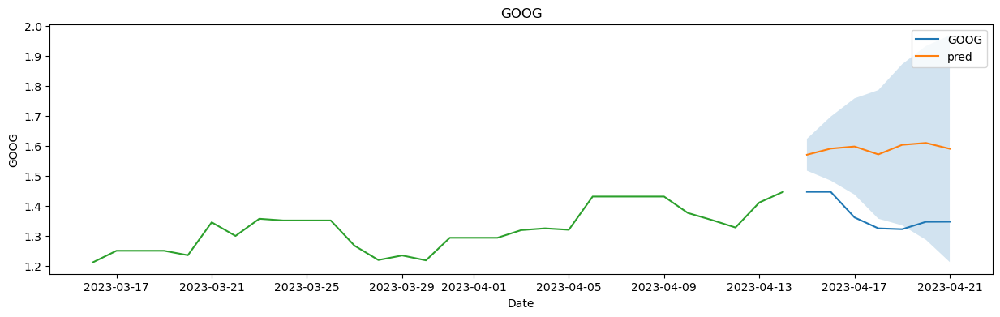

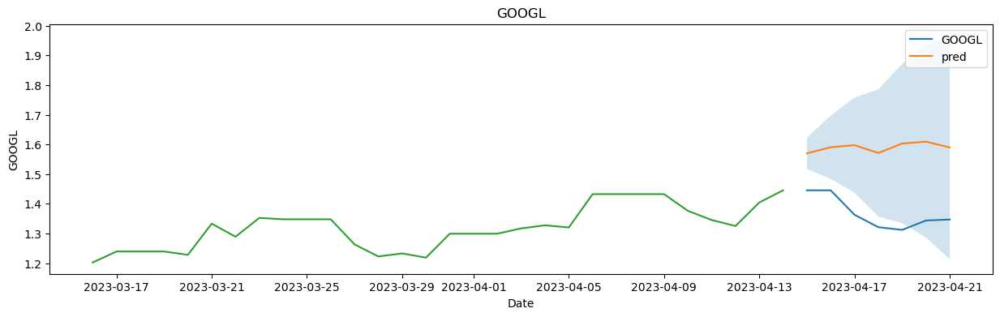

...

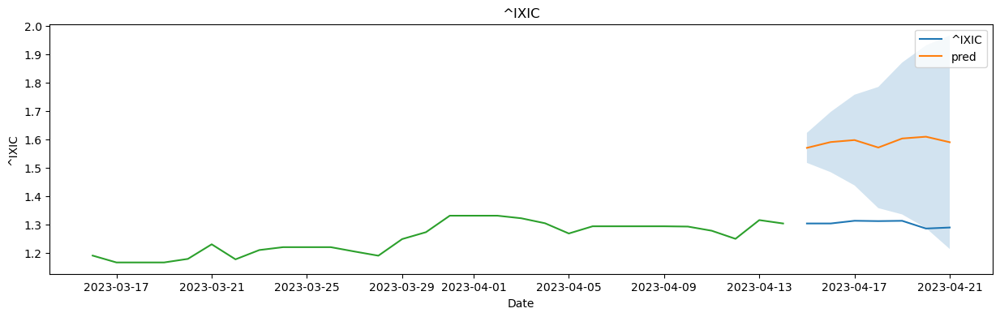

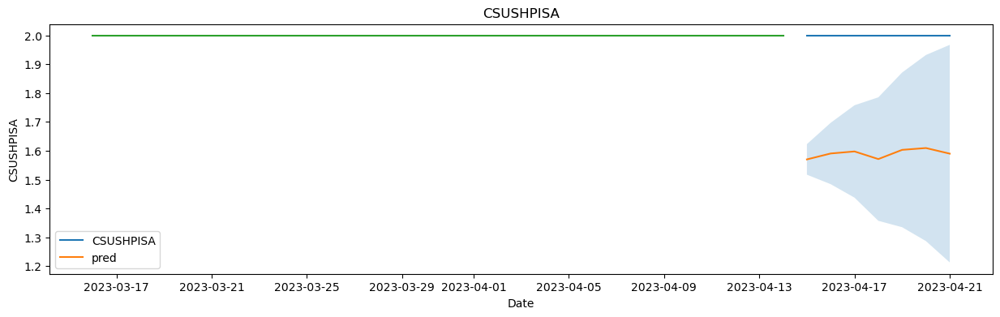

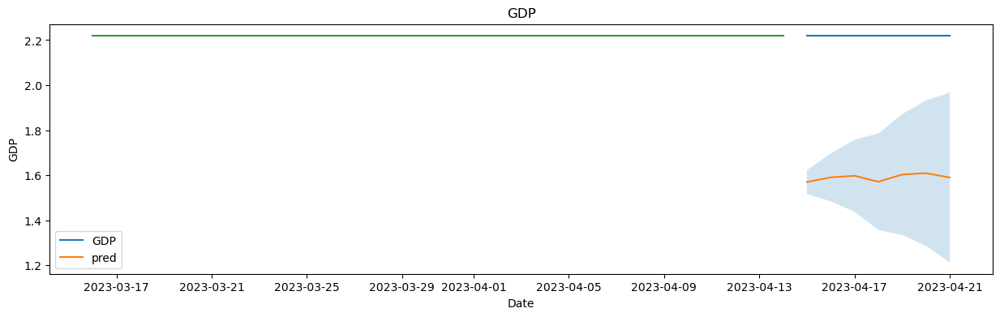

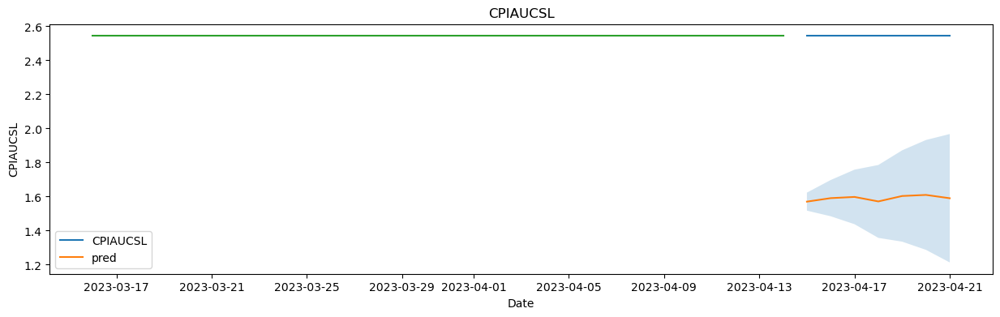

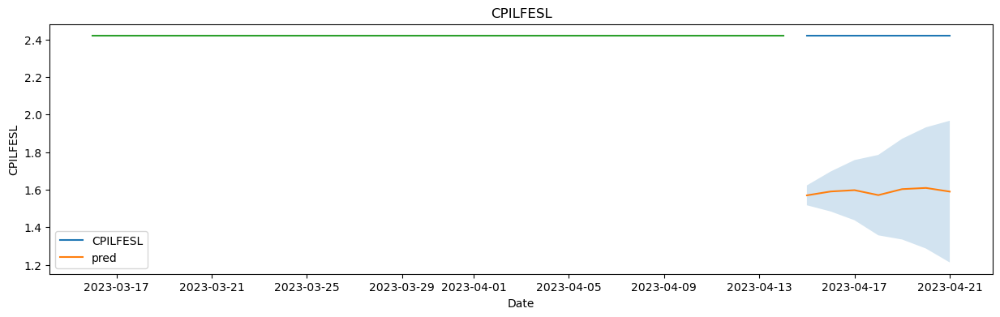

In [153]:
for col in df_test.columns:
    fig, ax = plt.subplots(1, 1, figsize=(15, 4))
    sns.lineplot(data=df_test,x=df_test.index, y=col, ax=ax, label=col)
    sns.lineplot(data=output, x=df_test.index, y='y_pred', ax=ax, label='pred')
    sns.lineplot(data=df_train.iloc[-order:], x=df_train.iloc[-order:].index, y=col, ax=ax)
    ax.fill_between(df_test.index, output_lower['y_pred'], output_upper['y_pred'], alpha=0.2)
    _ = ax.set_title(col)

### prophet facebook 

In [179]:
## Univariate

from prophet import Prophet
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
label_scaler = StandardScaler()

# test - train split

df_train = data_df[data_df.index <= (data_df.index[-1] - datetime.timedelta(days=7))]

df_train = df_train.reset_index().rename(columns={'Date': 'ds'})
df_train['y'] = df_train[label]

df_test = data_df[data_df.index > (data_df.index[-1] - datetime.timedelta(days=7))]
df_test = df_test.reset_index().rename(columns={'Date': 'ds'})
df_test['y'] = df_test[label]

label_scaler.fit(df_train['y'].values.reshape(-1, 1))

df_train['y'] = label_scaler.transform(df_train['y'].values.reshape(-1, 1))
df_train = df_train[["ds", 'y'] + predictors]

df_test['y'] = label_scaler.transform(df_test['y'].values.reshape(-1, 1))
df_test = df_test[["ds", 'y'] + predictors]

In [166]:
from prophet import Prophet

m = Prophet()

m.fit(df_train)

10:35:16 - cmdstanpy - INFO - Chain [1] start processing
10:35:17 - cmdstanpy - INFO - Chain [1] done processing


In [167]:
forecast = m.predict(df_test.drop(columns=['y']))
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

,ds,yhat,yhat_lower,yhat_upper
0,2023-04-15,1.510624,1.265784,1.726195
1,2023-04-16,1.511174,1.302249,1.729714
2,2023-04-17,1.511374,1.295933,1.726668
3,2023-04-18,1.513150,1.309330,1.728784
4,2023-04-19,1.514597,1.316363,1.729846
5,2023-04-20,1.514184,1.302683,1.737680
6,2023-04-21,1.514377,1.280035,1.722640


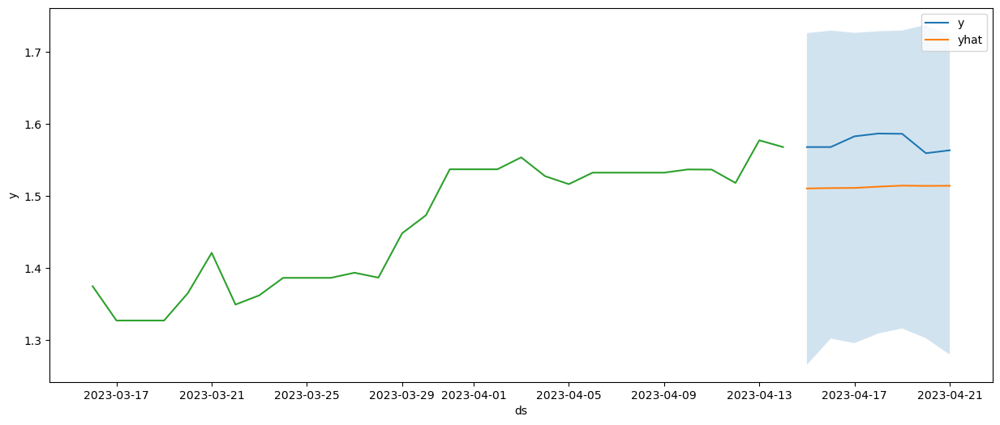

In [171]:
fig, ax = plt.subplots(1, 1, figsize=(15, 6))
sns.lineplot(data=df_test, x='ds', y='y', ax=ax, label='y')
sns.lineplot(data=forecast, x='ds', y='yhat', ax=ax, label='yhat')
sns.lineplot(data=df_train.iloc[-30:], x='ds', y='y', ax=ax)
ax.fill_between(forecast['ds'], forecast['yhat_lower'], forecast['yhat_upper'], alpha=0.2)

In [172]:

mae = mean_absolute_error(df_test['y'], forecast['yhat'])
mse = mean_squared_error(df_test['y'], forecast['yhat'])
rmse = mean_squared_error(df_test['y'], forecast['yhat'], squared=False)

mape = mape_metric(df_test['y'], forecast['yhat'])
smape = smape_metric(df_test['y'], forecast['yhat'])

print("MAPE:", mape)
print("SMAPE:", smape)
print(f"MAE: {mae}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")

MAPE: 3.865088898477425
SMAPE: 3.9435352112179864
MAE: 0.060892725229156196
MSE: 0.0038229555882931567
RMSE: 0.06183005408612511


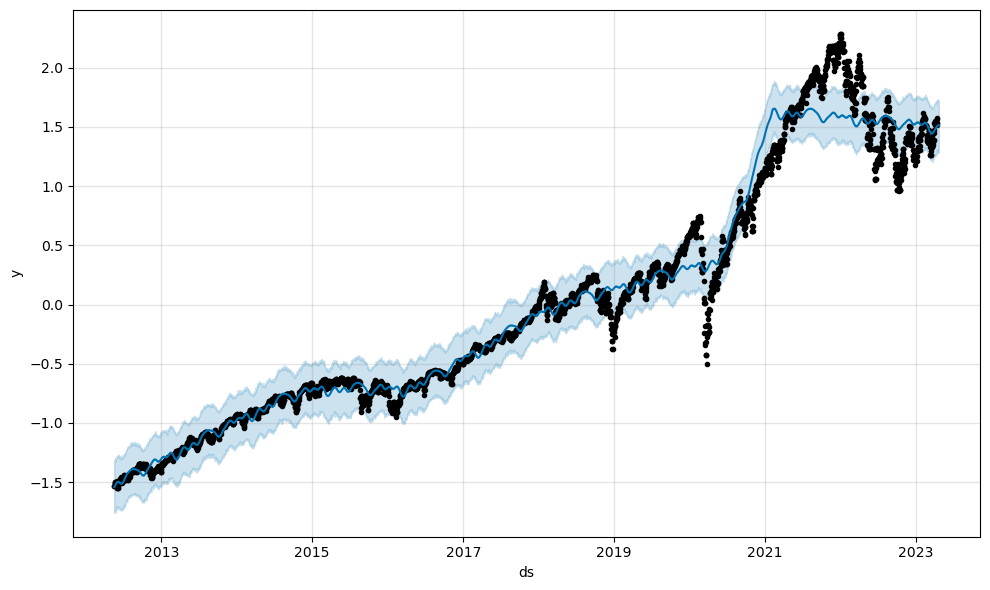

In [173]:
forecast = m.predict(data_df.reset_index().rename(columns={'Date': 'ds'})[['ds']])
fig1 = m.plot(forecast)

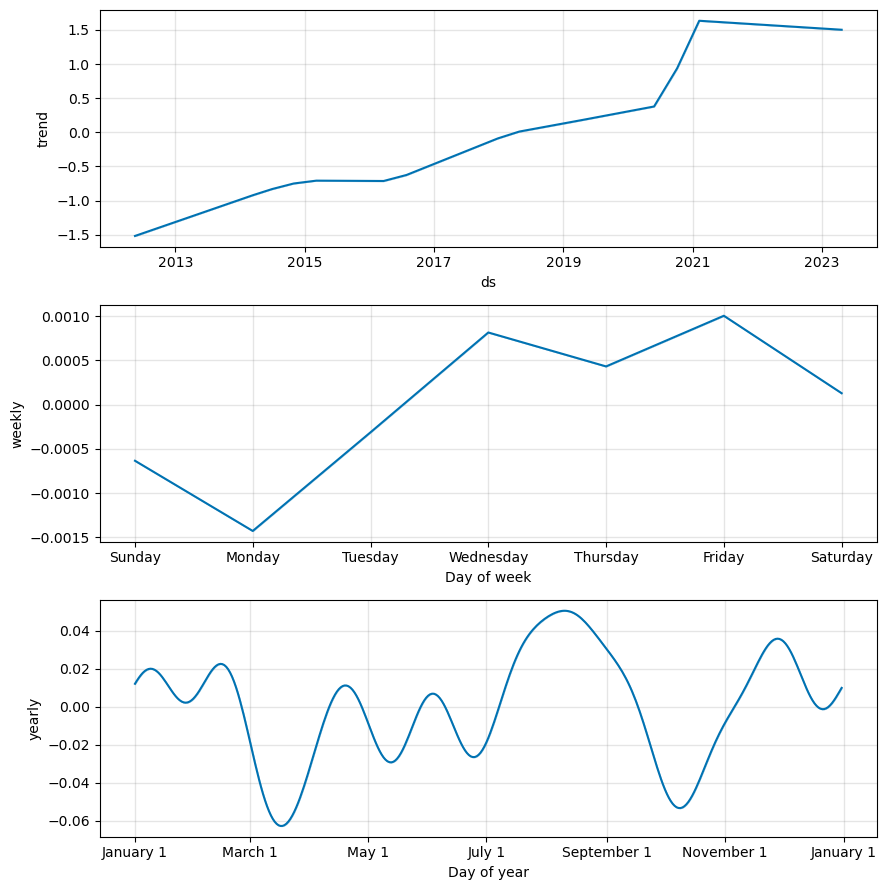

In [174]:
fig2 = m.plot_components(forecast)

In [180]:
### Multivariate

from prophet import Prophet
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
input_scaler = StandardScaler()
label_scaler = StandardScaler()

# test - train split
df_train = data_df[data_df.index <= (data_df.index[-1] - datetime.timedelta(days=7))]

df_train = df_train.reset_index().rename(columns={'Date': 'ds'})
df_train['y'] = df_train[label]

df_test = data_df[data_df.index > (data_df.index[-1] - datetime.timedelta(days=7))]
df_test = df_test.reset_index().rename(columns={'Date': 'ds'})
df_test['y'] = df_test[label]

input_scaler.fit(df_train[predictors])
label_scaler.fit(df_train['y'].values.reshape(-1, 1))

df_train[predictors] = input_scaler.transform(df_train[predictors])
df_train['y'] = label_scaler.transform(df_train['y'].values.reshape(-1, 1))
df_train = df_train[["ds", 'y'] + predictors]


df_test[predictors] = input_scaler.transform(df_test[predictors])
df_test['y'] = label_scaler.transform(df_test['y'].values.reshape(-1, 1))
df_test = df_test[["ds", 'y'] + predictors]


<Axes: xlabel='ds', ylabel='y'>

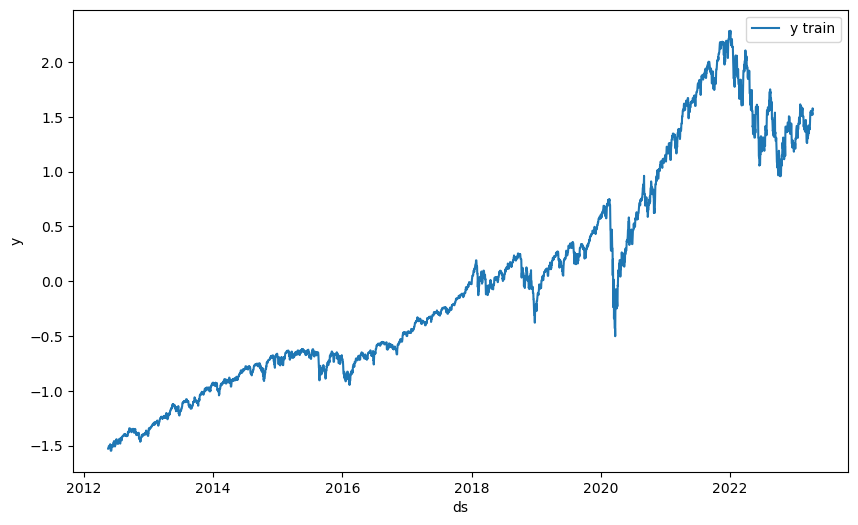

In [183]:
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
sns.lineplot(data=df_train, x='ds', y='y', ax=ax, label='y train')

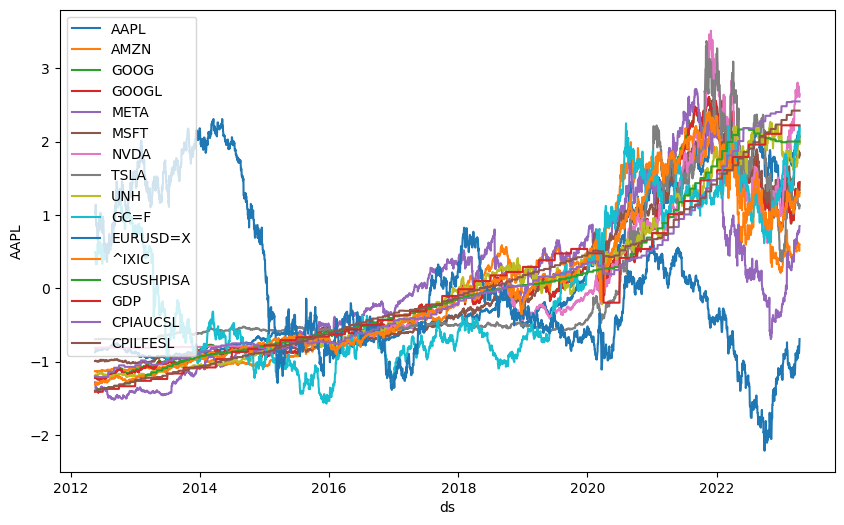

In [184]:
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
for i,c in enumerate(df_train.loc[:, (df_train.columns != 'ds') & (df_train.columns != 'y')].columns):
    sns.lineplot(data=df_train, x='ds', y=c, ax=ax, label=c)

In [185]:

# Initialize Prophet
model = Prophet()

# Add variables
for predictor in predictors:
    print("Add regressor: " + predictor)
    model.add_regressor(predictor, standardize=False)

# Fit the model
model.fit(df_train)


10:40:05 - cmdstanpy - INFO - Chain [1] start processing


Add regressor: AAPL
Add regressor: AMZN
Add regressor: GOOG
Add regressor: GOOGL
Add regressor: META
Add regressor: MSFT
Add regressor: NVDA
Add regressor: TSLA
Add regressor: UNH
Add regressor: GC=F
Add regressor: EURUSD=X
Add regressor: ^IXIC
Add regressor: CSUSHPISA
Add regressor: GDP
Add regressor: CPIAUCSL
Add regressor: CPILFESL


10:40:08 - cmdstanpy - INFO - Chain [1] done processing


In [189]:
# Make predictions
future = df_test.drop(columns=['y'])
for i in future.columns:
    if i != 'ds':
        future[i] = df_train.iloc[-1, :][i] # last know value in train

print(future)
forecast = model.predict(future)

# Visualize the results
#model.plot(forecast)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

          ds      AAPL      AMZN      GOOG     GOOGL      META      MSFT  \
0 2023-04-15  2.072572  0.598066  1.446559  1.445377  0.848324  1.814743   
1 2023-04-16  2.072572  0.598066  1.446559  1.445377  0.848324  1.814743   
2 2023-04-17  2.072572  0.598066  1.446559  1.445377  0.848324  1.814743   
3 2023-04-18  2.072572  0.598066  1.446559  1.445377  0.848324  1.814743   
4 2023-04-19  2.072572  0.598066  1.446559  1.445377  0.848324  1.814743   
5 2023-04-20  2.072572  0.598066  1.446559  1.445377  0.848324  1.814743   
6 2023-04-21  2.072572  0.598066  1.446559  1.445377  0.848324  1.814743   

       NVDA      TSLA       UNH      GC=F  EURUSD=X     ^IXIC  CSUSHPISA  \
0  2.645059  1.129598  1.968495  2.060089 -0.692804  1.302876    1.99968   
1  2.645059  1.129598  1.968495  2.060089 -0.692804  1.302876    1.99968   
2  2.645059  1.129598  1.968495  2.060089 -0.692804  1.302876    1.99968   
3  2.645059  1.129598  1.968495  2.060089 -0.692804  1.302876    1.99968   
4  2.645059

,ds,yhat,yhat_lower,yhat_upper
0,2023-04-15,1.604768,1.571983,1.641039
1,2023-04-16,1.605236,1.570457,1.640193
2,2023-04-17,1.604371,1.572085,1.637267
3,2023-04-18,1.603675,1.569335,1.636933
4,2023-04-19,1.603229,1.568866,1.638188
5,2023-04-20,1.603076,1.568448,1.640738
6,2023-04-21,1.603314,1.571396,1.638056


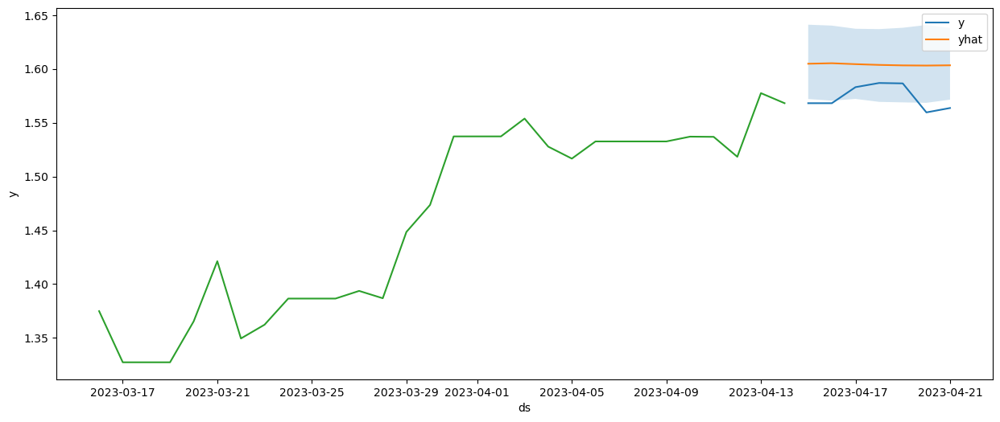

In [191]:
fig, ax = plt.subplots(1, 1, figsize=(15, 6))
sns.lineplot(data=df_test, x='ds', y='y', ax=ax, label='y')
sns.lineplot(data=forecast, x='ds', y='yhat', ax=ax, label='yhat')
sns.lineplot(data=df_train.iloc[-30:], x='ds', y='y', ax=ax)
ax.fill_between(forecast['ds'], forecast['yhat_lower'], forecast['yhat_upper'], alpha=0.2)


In [192]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

mae = mean_absolute_error(df_test['y'], forecast['yhat'])
mse = mean_squared_error(df_test['y'], forecast['yhat'])
rmse = mean_squared_error(df_test['y'], forecast['yhat'], squared=False)

mape = mape_metric(df_test['y'], forecast['yhat'])
smape = smape_metric(df_test['y'], forecast['yhat'])

print("MAPE:", mape)
print("SMAPE:", smape)
print(f"MAE: {mae}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")

MAPE: 1.928616064242065
SMAPE: 1.9078818706629037
MAE: 0.03027712282985671
MSE: 0.001030477394326605
RMSE: 0.032101049738701766


### Vanilla LSTM

In [43]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
input_scaler = StandardScaler()
label_scaler = StandardScaler()

# test - train split
df_train = data_df[data_df.index <= (data_df.index[-1] - datetime.timedelta(days=7))]
df_train['y'] = df_train[label]

df_test = data_df[data_df.index > (data_df.index[-1] - datetime.timedelta(days=7))]
df_test['y'] = df_test[label]

input_scaler.fit(df_train[predictors])
label_scaler.fit(df_train['y'].values.reshape(-1, 1))

df_train[predictors] = input_scaler.transform(df_train[predictors])
df_train['y'] = label_scaler.transform(df_train['y'].values.reshape(-1, 1))
df_train = df_train[['y'] + predictors]

df_test[predictors] = input_scaler.transform(df_test[predictors])
df_test['y'] = label_scaler.transform(df_test['y'].values.reshape(-1, 1))
df_test = df_test[['y'] + predictors]


# validation
df_val = df_train.iloc[-60:,:]
df_train = df_train.iloc[ :-60,:]

In [61]:
import yaml
import argparse
import numpy as np
import pandas as pd
from pathlib import Path
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader


# with open("model/params.yaml", "r") as params_file:
#     params = yaml.safe_load(params_file)

# model_dir = params['model_dir']


class TimeSeriesDataset(Dataset):   
    def __init__(self, X, y, seq_len=1):
        self.X = X
        self.y = y
        self.seq_len = seq_len

    def __len__(self):
        return self.X.__len__() - self.seq_len

    def __getitem__(self, index):
        return self.X[index:index+self.seq_len], self.y[index+self.seq_len]


class TSModel(nn.Module):
    def __init__(self, n_features, n_hidden=64, n_layers=1):
        super(TSModel, self).__init__()

        self.n_hidden = n_hidden
        self.lstm = nn.LSTM(
            input_size=n_features,
            hidden_size=n_hidden,
            batch_first=True,
            num_layers=n_layers,
            dropout=0.5
        )
        self.linear = nn.Linear(n_hidden, 1)
        
    def forward(self, x):
        _, (hidden, _) = self.lstm(x)
        lstm_out = hidden[-1]  # output last hidden state output
        y_pred = self.linear(lstm_out)
        
        return y_pred
    

def train_model(
        train_df,
        test_df,
        label_name,
        sequence_length,
        batch_size,
        n_epochs,
        n_epochs_stop
):
    """Train LSTM model."""
    print("Starting with model training...")

    # create dataloaders
    train_dataset = TimeSeriesDataset(np.array(train_df), np.array(train_df[label_name]), seq_len=sequence_length)
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

    test_dataset = TimeSeriesDataset(np.array(test_df), np.array(test_df[label_name]), seq_len=sequence_length)
    test_loader = DataLoader(test_dataset, batch_size=60, shuffle=False)

    # set up training
    n_features = train_df.shape[1]
    model = TSModel(n_features)
    criterion = torch.nn.MSELoss()  # L1Loss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

    train_hist = []
    test_hist = []

    # start training
    best_loss = np.inf
    epochs_no_improve = 0
    for epoch in range(1, n_epochs+1):
        running_loss = 0
        model.train()

        for batch_idx, (data, target) in enumerate(train_loader, 1):
            # zero the parameter gradients
            optimizer.zero_grad()

            # forward + backward + optimize
            data = torch.Tensor(np.array(data))
            output = model(data)
            loss = criterion(output.flatten(), target.type_as(output))
            # if type(criterion) == torch.nn.modules.loss.MSELoss:
            #     loss = torch.sqrt(loss)  # RMSE
            loss.backward()
            optimizer.step()

            running_loss += loss.item()
        running_loss /= len(train_loader)
        train_hist.append(running_loss)

        # test loss
        model.eval()
        test_loss = 0
        with torch.no_grad():
            for data, target in test_loader:
                data = torch.Tensor(np.array(data))
                output = model(data)
                loss = criterion(output.flatten(), target.type_as(output))
                test_loss += loss.item()
            test_loss /= len(test_loader)
            test_hist.append(test_loss)

            # early stopping
            if test_loss < best_loss:
                best_loss = test_loss
#                 torch.save(model.state_dict(), Path(model_dir, 'model.pt'))
                epochs_no_improve = 0
            else:
                epochs_no_improve += 1
            if epochs_no_improve == n_epochs_stop:
                print("Early stopping.")
                break

        print(f'Epoch {epoch} train loss: {round(running_loss,4)} test loss: {round(test_loss,4)}')

        hist = pd.DataFrame()
        hist['training_loss'] = train_hist
        hist['test_loss'] = test_hist

    print("Completed.")

    return hist, model





In [66]:
sequence_length = 30
batch_size = 8
n_epochs = 15
n_epochs_stop = 20
label_name = 'y'

hist, model = train_model(df_train, df_val, label_name, sequence_length, batch_size, n_epochs, n_epochs_stop)


Starting with model training...
Epoch 1 train loss: 0.0418 test loss: 0.0245
Epoch 2 train loss: 0.0134 test loss: 0.0584
Epoch 3 train loss: 0.0127 test loss: 0.0695
Epoch 4 train loss: 0.0114 test loss: 0.0842
Epoch 5 train loss: 0.0105 test loss: 0.0946
Epoch 6 train loss: 0.0079 test loss: 0.1011
Epoch 7 train loss: 0.0074 test loss: 0.0989
Epoch 8 train loss: 0.0067 test loss: 0.0914
Epoch 9 train loss: 0.0066 test loss: 0.0831
Epoch 10 train loss: 0.0064 test loss: 0.073
Epoch 11 train loss: 0.0063 test loss: 0.066
Epoch 12 train loss: 0.0062 test loss: 0.05
Epoch 13 train loss: 0.0065 test loss: 0.0434
Epoch 14 train loss: 0.006 test loss: 0.0285
Epoch 15 train loss: 0.0057 test loss: 0.0312
Completed.


In [67]:
model

TSModel(
  (lstm): LSTM(17, 64, batch_first=True, dropout=0.5)
  (linear): Linear(in_features=64, out_features=1, bias=True)
)

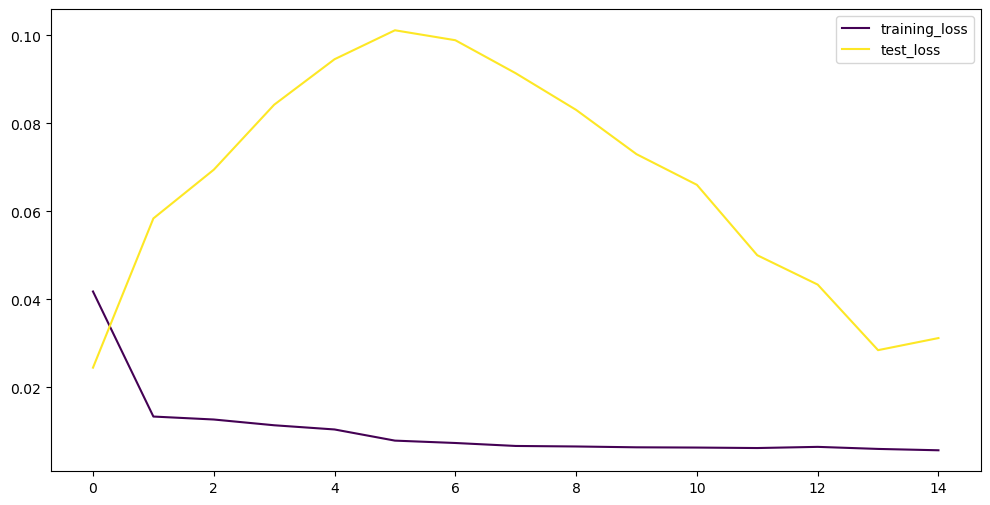

In [68]:
hist.plot(figsize=(12,6), cmap='viridis')
plt.show()

In [73]:
model.eval()

test_dataset = TimeSeriesDataset(np.array(df_val), np.array(df_val[label_name]), seq_len=sequence_length)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

predictions = []
labels = []
with torch.no_grad():
    for features, target in test_loader:
        features = torch.Tensor(np.array(features))
        output = model(features)
        predictions.append(output.item())
        labels.append(target.item())

labels = np.array(labels)
predictions = np.array(predictions)

In [74]:
mae = mean_absolute_error(labels, predictions)
mse = mean_squared_error(labels, predictions)
rmse = mean_squared_error(labels, predictions, squared=False)

mape = mape_metric(labels, predictions)
smape = smape_metric(labels, predictions)

print("MAPE:", mape)
print("SMAPE:", smape)
print(f"MAE: {mae}")
print(f"MSE: {mse}")
print(f"RMSE: {rmse}")


MAPE: 11.789497269439023
SMAPE: 11.056310903279611
MAE: 0.1687792654976299
MSE: 0.031224369556114854
RMSE: 0.1767041865834391


## Deep learning models

models:
Multivariate Time Series Forecasting 


In [75]:
from tensorflow.python.client import device_lib
import tensorflow
print(tensorflow.__version__)
def get_available_gpus():
    local_device_protos = device_lib.list_local_devices()
    return [x.name for x in local_device_protos if x.device_type == 'GPU']
print(get_available_gpus())

2.11.0
['/device:GPU:0']


2023-05-06 12:58:33.719276: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-06 12:58:33.720169: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-05-06 12:58:33.720632: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-05-06 12:58:33.720796: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least on

In [5]:
import torch

print(torch.cuda.is_available())
print(torch.cuda.current_device())
print(torch.cuda.device_count())
print(torch.cuda.get_device_name(0))

True
0
1
NVIDIA GeForce RTX 3060


In [128]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
input_scaler = StandardScaler()
label_scaler = StandardScaler()

# test - train split
df_train = data_df[data_df.index <= (data_df.index[-1] - datetime.timedelta(days=7))]

df_train = df_train.reset_index().rename(columns={'Date': 'date'})
df_train['y'] = df_train[label]

df_test = data_df[data_df.index > (data_df.index[-1] - datetime.timedelta(days=7))]
df_test = df_test.reset_index().rename(columns={'Date': 'date'})
df_test['y'] = df_test[label]

input_scaler.fit(df_train[predictors])
label_scaler.fit(df_train['y'].values.reshape(-1, 1))

df_train[predictors] = input_scaler.transform(df_train[predictors])
df_train['y'] = label_scaler.transform(df_train['y'].values.reshape(-1, 1))
df_train = df_train[["date", 'y'] + predictors]


df_test[predictors] = input_scaler.transform(df_test[predictors])
df_test['y'] = label_scaler.transform(df_test['y'].values.reshape(-1, 1))
df_test = df_test[["date", 'y'] + predictors]



In [129]:
train_series = df_train.melt(id_vars=['date'], var_name='series', value_name='value')

train_series[['series']] = train_series[['series']].astype(str)
train_series['value'] = pd.to_numeric(train_series['value'], downcast='float')

print(train_series.dtypes)

min_date = train_series['date'].min()
train_series["time_idx"] = train_series["date"].map(lambda current_date: (current_date - min_date).days)

print(train_series["time_idx"].min())
print(train_series["time_idx"].max())

print(train_series.shape)
train_series.head()

date      datetime64[ns]
series            object
value            float32
dtype: object
0
3983
(67728, 4)


,date,series,value,time_idx
0,2012-05-18,y,-1.528398,0
1,2012-05-19,y,-1.528398,1
2,2012-05-20,y,-1.528398,2
3,2012-05-21,y,-1.505771,3
4,2012-05-22,y,-1.505074,4


###  DeepAR / DeepVAR 

In [130]:
import lightning.pytorch as pl
from lightning.pytorch.callbacks import EarlyStopping
import matplotlib.pyplot as plt
import pandas as pd
import torch

from pytorch_forecasting import Baseline, DeepAR, TimeSeriesDataSet
from pytorch_forecasting.data import NaNLabelEncoder
from pytorch_forecasting.data.examples import generate_ar_data
from pytorch_forecasting.metrics import MAE, SMAPE, MultivariateNormalDistributionLoss

In [145]:
# create dataset and dataloaders
max_encoder_length = 60
max_prediction_length = 20

training_cutoff = train_series["time_idx"].max() - max_prediction_length

context_length = max_encoder_length
prediction_length = max_prediction_length

training = TimeSeriesDataSet(
    train_series[lambda x: x.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="value",
    categorical_encoders={"series": NaNLabelEncoder().fit(train_series.series)},
    group_ids=["series"],
    static_categoricals=[
        "series"
    ],  # as we plan to forecast correlations, it is important to use series characteristics (e.g. a series identifier)
    time_varying_unknown_reals=["value"],
    max_encoder_length=context_length,
    max_prediction_length=prediction_length,
)

# for validation
validation = TimeSeriesDataSet.from_dataset(training, train_series, min_prediction_idx=training_cutoff + 1)
batch_size = 128
# synchronize samples in each batch over time - only necessary for DeepVAR, not for DeepAR
train_dataloader = training.to_dataloader(
    train=True, batch_size=batch_size, num_workers=0, batch_sampler="synchronized"
)
val_dataloader = validation.to_dataloader(
    train=False, batch_size=batch_size, num_workers=0, batch_sampler="synchronized"
)

In [146]:
# calculate baseline absolute error
baseline_predictions = Baseline().predict(val_dataloader, trainer_kwargs=dict(accelerator="cpu"), return_y=True)
SMAPE()(baseline_predictions.output, baseline_predictions.y)

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


tensor(0.0481)

Global seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3060') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

LR finder stopped early after 2 steps due to diverging loss.
Failed to compute suggestion for learning rate because there are not enough points. Increase the loop iteration limits or the size of your dataset/dataloader.
Restoring states from the checkpoint path at /home/freddy/MIAD_project/MIAD_P/MIAD_proyecto_grado/.lr_find_d9f04936-a457-4e58-b03c-edd1a2f29bd1.ckpt
Restored all states from the checkpoint at /home/freddy/MIAD_project/MIAD_P/MIAD_proyecto_grado/.lr_find_d9f04936-a457-4e58-b03c-edd1a2f29bd1.ckpt
Failed to compute suggestion for learning rate because there are not enough points. Increase the loop iteration limits or the size of your dataset/dataloader.
Failed to compute suggestion for learning rate because there are not enough points. Increase the loop iteration limits or the size of your dataset/dataloader.


suggested learning rate: None


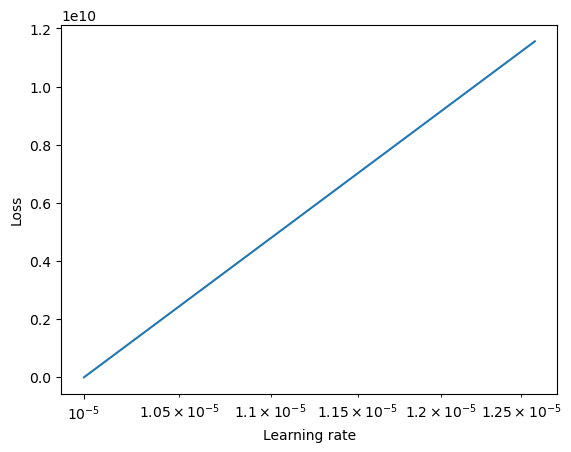

Failed to compute suggestion for learning rate because there are not enough points. Increase the loop iteration limits or the size of your dataset/dataloader.


In [136]:
pl.seed_everything(42)
import pytorch_forecasting as ptf

trainer = pl.Trainer(accelerator="gpu", gradient_clip_val=1e-1)
net = DeepAR.from_dataset(
    training,
    learning_rate=3e-2,
    hidden_size=30,
    rnn_layers=2,
    loss=MultivariateNormalDistributionLoss(rank=30),
    optimizer="Adam",
)

# find optimal learning rate
from lightning.pytorch.tuner import Tuner

res = Tuner(trainer).lr_find(
    net,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
    min_lr=1e-5,
    max_lr=1e0,
    early_stop_threshold=100,
)
print(f"suggested learning rate: {res.suggestion()}")
fig = res.plot(show=True, suggest=True)
fig.show()
net.hparams.learning_rate = res.suggestion()

In [147]:

# 

early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=False, mode="min")
trainer = pl.Trainer(
    max_epochs=100,
    accelerator="gpu",
    enable_model_summary=True,
    gradient_clip_val=0.1,
    callbacks=[early_stop_callback],
    limit_train_batches=50,
    enable_checkpointing=True,
)


net = DeepAR.from_dataset(
    training,
    learning_rate=1e-2,
    log_interval=10,
    log_val_interval=1,
    hidden_size=64,
    rnn_layers=2,
    optimizer="Adam",
    loss=MultivariateNormalDistributionLoss(rank=30),
)

trainer.fit(
    net,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3060') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 136   
3 | rnn                    | LSTM                               | 52.5

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [150]:
best_model_path = trainer.checkpoint_callback.best_model_path
best_model = DeepAR.load_from_checkpoint(best_model_path)

In [151]:
# best_model = net
predictions = best_model.predict(val_dataloader, trainer_kwargs=dict(accelerator="cpu"), return_y=True)
MAE()(predictions.output, predictions.y)

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


tensor(0.1198)

In [152]:
raw_predictions = net.predict(
    val_dataloader, mode="raw", return_x=True, n_samples=100, trainer_kwargs=dict(accelerator="cpu")
)

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


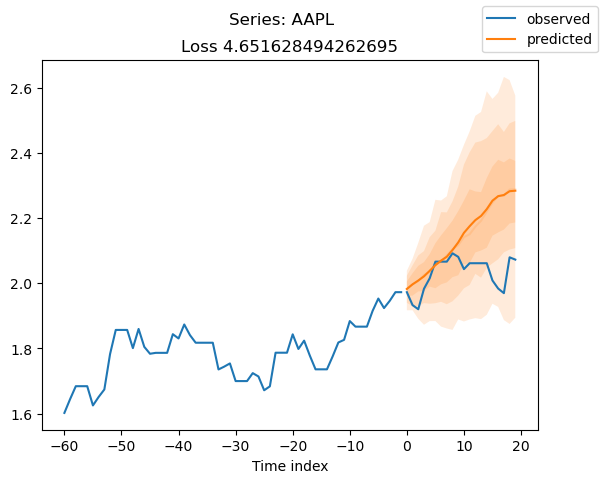

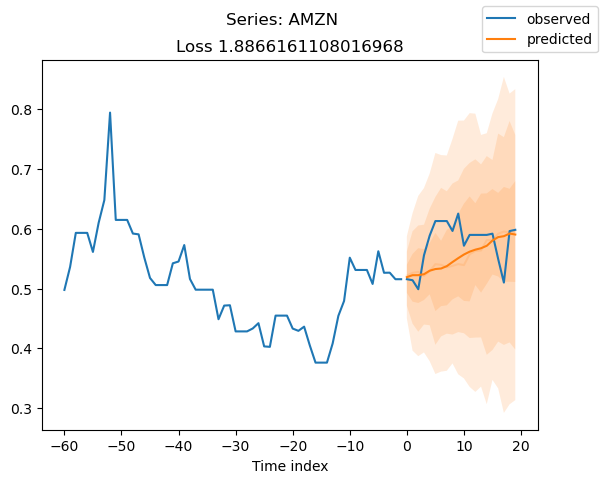

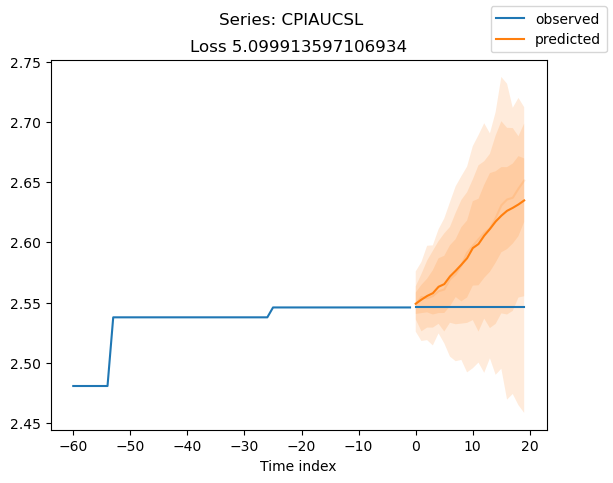

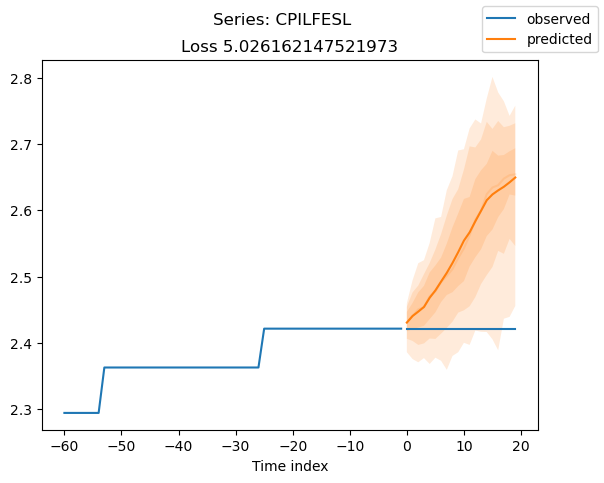

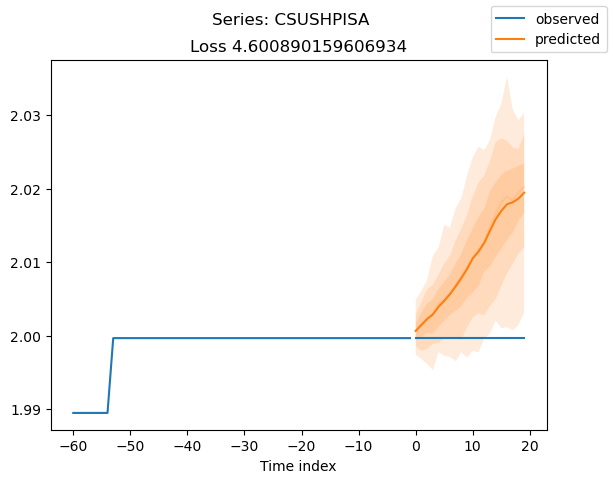

...

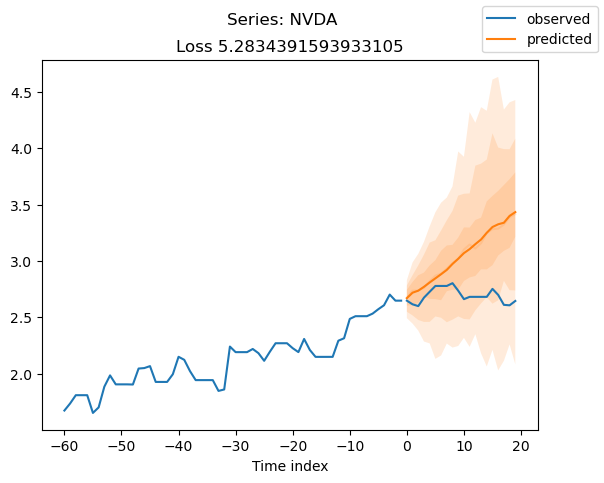

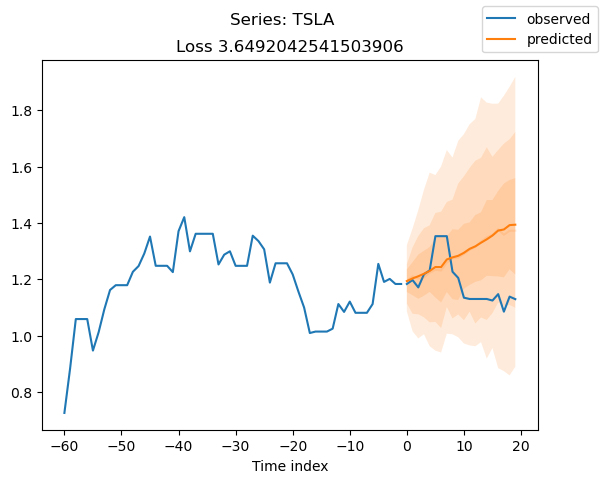

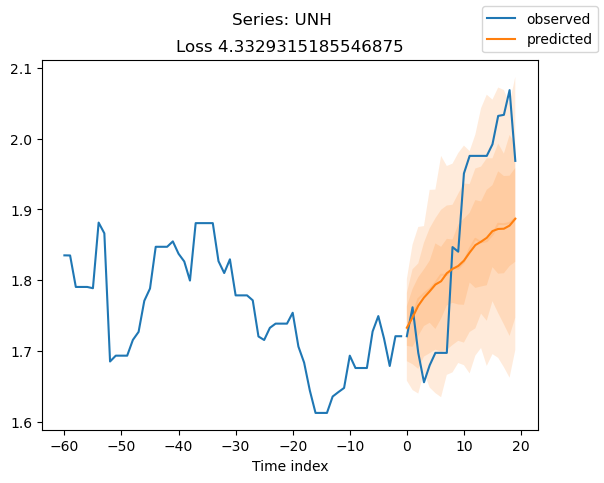

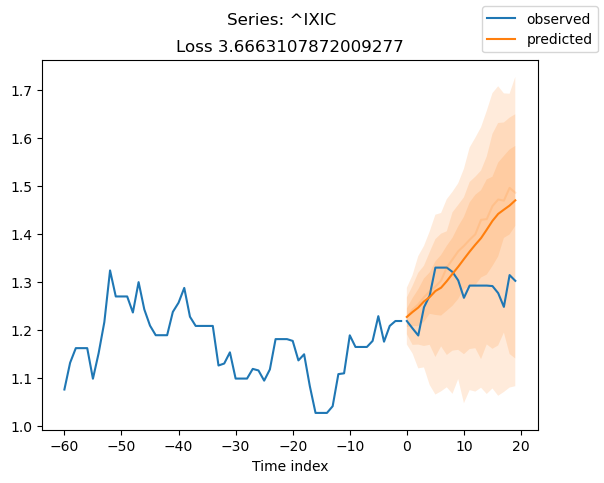

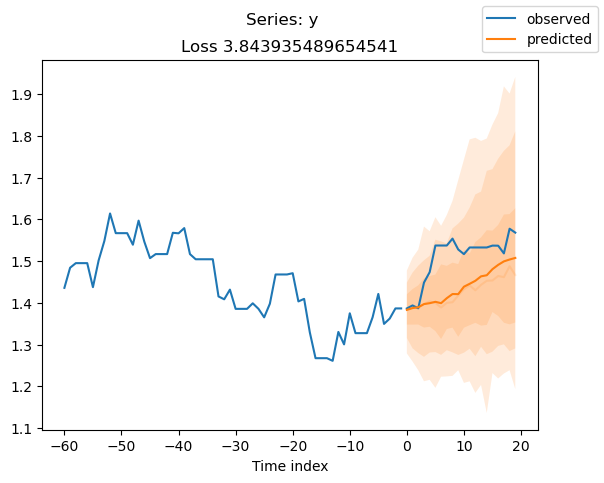

In [153]:
series = validation.x_to_index(raw_predictions.x)["series"]
for idx in range(17):  
    best_model.plot_prediction(raw_predictions.x, raw_predictions.output, idx=idx, add_loss_to_title=True)
    plt.suptitle(f"Series: {series.iloc[idx]}")

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


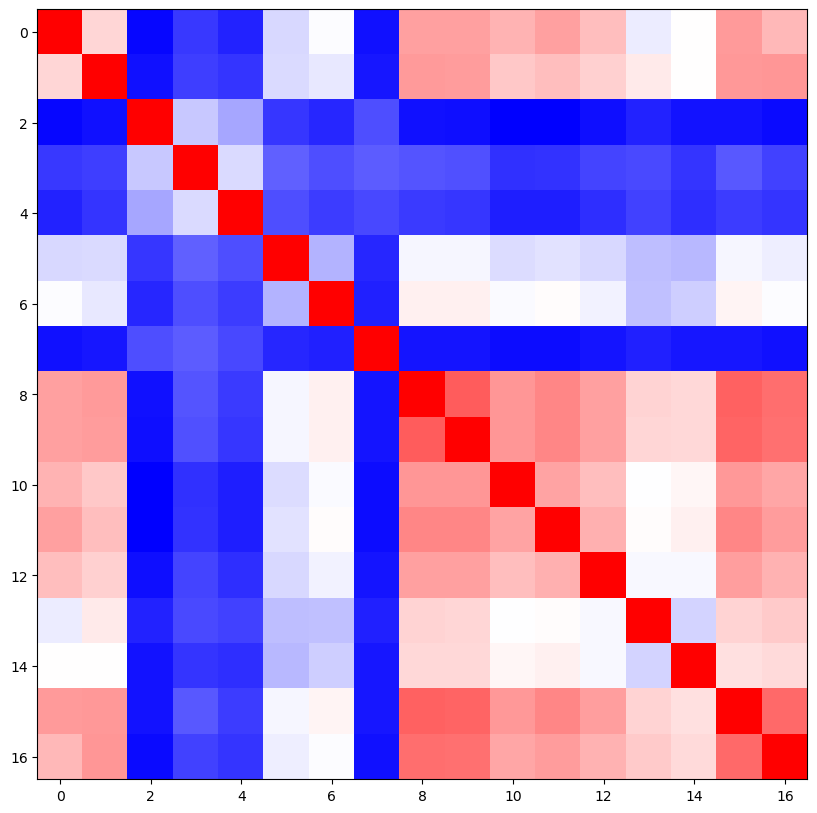

In [154]:
cov_matrix = best_model.loss.map_x_to_distribution(
    best_model.predict(
        val_dataloader, mode=("raw", "prediction"), n_samples=None, trainer_kwargs=dict(accelerator="cpu")
    )
).base_dist.covariance_matrix.mean(0)

# normalize the covariance matrix diagnoal to 1.0
correlation_matrix = cov_matrix / torch.sqrt(torch.diag(cov_matrix)[None] * torch.diag(cov_matrix)[None].T)

fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(correlation_matrix, cmap="bwr")

(array([56., 46.,  8.,  2., 12., 34., 28., 32., 40., 14.]),
 array([-0.10724846, -0.01664605,  0.07395635,  0.16455875,  0.25516114,
         0.34576356,  0.43636596,  0.52696836,  0.61757076,  0.70817316,
         0.79877555]),
 <BarContainer object of 10 artists>)

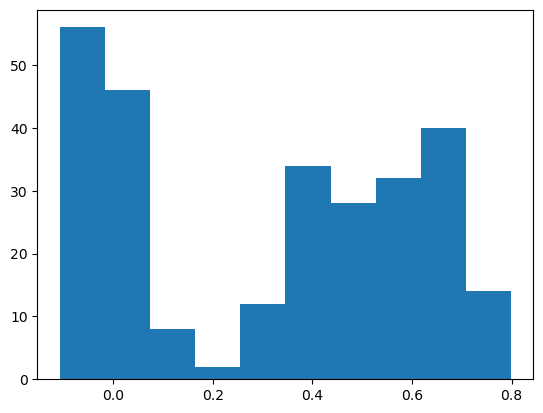

In [155]:
# distribution of off-diagonal correlations
plt.hist(correlation_matrix[correlation_matrix < 1].numpy())

### Temporal Fusion Transformer (TFT )

In [95]:
import copy
from pathlib import Path
import warnings

import lightning.pytorch as pl
from lightning.pytorch.callbacks import EarlyStopping, LearningRateMonitor
from lightning.pytorch.loggers import TensorBoardLogger
import numpy as np
import pandas as pd
import torch

from pytorch_forecasting import Baseline, TemporalFusionTransformer, TimeSeriesDataSet
from pytorch_forecasting.data import GroupNormalizer
from pytorch_forecasting.metrics import MAE, SMAPE, PoissonLoss, QuantileLoss
from pytorch_forecasting.models.temporal_fusion_transformer.tuning import optimize_hyperparameters

In [96]:
train_series

,date,series,value,time_idx
0,2012-05-18,y,-1.527297,0
1,2012-05-19,y,-1.527297,1
2,2012-05-20,y,-1.527297,2
3,2012-05-21,y,-1.504635,3
4,2012-05-22,y,-1.503937,4
...,...,...,...,...
83470,2023-04-01,CPILFESL,2.440052,3970
83471,2023-04-02,CPILFESL,2.440052,3971
83472,2023-04-03,CPILFESL,2.440052,3972
83473,2023-04-04,CPILFESL,2.440052,3973


In [111]:
max_encoder_length = 60
max_prediction_length =20


training_cutoff = train_series["time_idx"].max() - max_prediction_length


training = TimeSeriesDataSet(
    train_series[lambda x: x.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="value",
    group_ids=["series"],
    min_encoder_length=max_encoder_length // 2,  # keep encoder length long (as it is in the validation set)
    max_encoder_length=max_encoder_length,
    min_prediction_length=1,
    max_prediction_length=max_prediction_length,
    static_categoricals=["series"],
#     static_reals=[],
#     time_varying_known_categoricals=[],
#     variable_groups={},  # group of categorical variables can be treated as one variable
    time_varying_known_reals=["time_idx"],
#     time_varying_unknown_categoricals=[],
    time_varying_unknown_reals=[
        "value"
    ],
#     target_normalizer=GroupNormalizer(
#         groups=["series"], transformation="softplus"
#     ),  # use softplus and normalize by group
    add_relative_time_idx=True,
    add_target_scales=True,
    add_encoder_length=True,
)

# create validation set (predict=True) which means to predict the last max_prediction_length points in time
# for each series
validation = TimeSeriesDataSet.from_dataset(training, train_series, predict=True, stop_randomization=True)

# create dataloaders for model
batch_size = 128  # set this between 32 to 128
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size * 10, num_workers=0)

In [112]:
# calculate baseline mean absolute error, i.e. predict next value as the last available value from the history
baseline_predictions = Baseline().predict(val_dataloader, return_y=True)
MAE()(baseline_predictions.output, baseline_predictions.y)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


tensor(0.1065, device='cuda:0')

In [113]:
# configure network and trainer
pl.seed_everything(42)
trainer = pl.Trainer(
    accelerator="cpu",
    # clipping gradients is a hyperparameter and important to prevent divergance
    # of the gradient for recurrent neural networks
    gradient_clip_val=0.1,
)


tft = TemporalFusionTransformer.from_dataset(
    training,
    # not meaningful for finding the learning rate but otherwise very important
    learning_rate=0.03,
    hidden_size=8,  # most important hyperparameter apart from learning rate
    # number of attention heads. Set to up to 4 for large datasets
    attention_head_size=1,
    dropout=0.1,  # between 0.1 and 0.3 are good values
    hidden_continuous_size=8,  # set to <= hidden_size
    loss=QuantileLoss(),
    optimizer="Ranger"
    # reduce learning rate if no improvement in validation loss after x epochs
    # reduce_on_plateau_patience=1000,
)
print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")

Global seed set to 42
GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Number of parameters in network: 7.0k


Finding best initial lr: 100%|██████████| 100/100 [00:18<00:00,  5.29it/s]
Learning rate set to 0.33884415613920277
Restoring states from the checkpoint path at C:\Users\User\miad_p\MIAD_proyecto_grado\.lr_find_4397881c-dcad-4f2a-88c9-6fb7951c3c22.ckpt
Restored all states from the checkpoint at C:\Users\User\miad_p\MIAD_proyecto_grado\.lr_find_4397881c-dcad-4f2a-88c9-6fb7951c3c22.ckpt


suggested learning rate: 0.33884415613920277


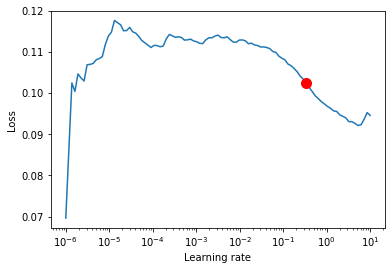

In [114]:
# find optimal learning rate
from lightning.pytorch.tuner import Tuner

res = Tuner(trainer).lr_find(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
    max_lr=10.0,
    min_lr=1e-6,
)

print(f"suggested learning rate: {res.suggestion()}")
fig = res.plot(show=True, suggest=True)
fig.show()

In [115]:
# configure network and trainer
early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=False, mode="min")
lr_logger = LearningRateMonitor()  # log the learning rate
logger = TensorBoardLogger("lightning_logs")  # logging results to a tensorboard

trainer = pl.Trainer(
    max_epochs=50,
    accelerator="gpu",
    enable_model_summary=True,
    gradient_clip_val=0.1,
    limit_train_batches=50,  # coment in for training, running valiation every 30 batches
    # fast_dev_run=True,  # comment in to check that networkor dataset has no serious bugs
    callbacks=[lr_logger, early_stop_callback],
    logger=logger,
)

tft = TemporalFusionTransformer.from_dataset(
    training,
    learning_rate=0.03,
    hidden_size=16,
    attention_head_size=2,
    dropout=0.1,
    hidden_continuous_size=8,
    loss=QuantileLoss(),
    log_interval=10,  # uncomment for learning rate finder and otherwise, e.g. to 10 for logging every 10 batches
    optimizer="Ranger",
    reduce_on_plateau_patience=4,
)
print(f"Number of parameters in network: {tft.size()/1e3:.1f}k")

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Number of parameters in network: 18.9k


In [116]:
# fit network
trainer.fit(
    tft,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
)

You are using a CUDA device ('NVIDIA GeForce RTX 3060') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
Missing logger folder: lightning_logs\lightning_logs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

   | Name                               | Type                            | Params
----------------------------------------------------------------------------------------
0  | loss                               | QuantileLoss                    | 0     
1  | logging_metrics                    | ModuleList                      | 0     
2  | input_embeddings                   | MultiEmbedding                  | 189   
3  | prescalers                         | ModuleDict                      | 96    
4  | static_variable_selection      

Epoch 0: 100%|██████████| 50/50 [00:11<00:00,  4.48it/s, v_num=0, train_loss_step=0.0927]
Validation: 0it [00:00, ?it/s]
Epoch 1: 100%|██████████| 50/50 [00:11<00:00,  4.53it/s, v_num=0, train_loss_step=0.0683, val_loss=0.112, train_loss_epoch=0.111]
Validation: 0it [00:00, ?it/s]
Epoch 2: 100%|██████████| 50/50 [00:11<00:00,  4.34it/s, v_num=0, train_loss_step=0.0642, val_loss=0.0917, train_loss_epoch=0.0676]
Validation: 0it [00:00, ?it/s]
Epoch 3: 100%|██████████| 50/50 [00:11<00:00,  4.22it/s, v_num=0, train_loss_step=0.0558, val_loss=0.0918, train_loss_epoch=0.0654]
Validation: 0it [00:00, ?it/s]
Epoch 4: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s, v_num=0, train_loss_step=0.0438, val_loss=0.095, train_loss_epoch=0.0673]
Validation: 0it [00:00, ?it/s]
Epoch 5: 100%|██████████| 50/50 [00:11<00:00,  4.50it/s, v_num=0, train_loss_step=0.062, val_loss=0.0726, train_loss_epoch=0.058]  
Validation: 0it [00:00, ?it/s]
Epoch 6: 100%|██████████| 50/50 [00:11<00:00,  4.32it/s, v_num=0, t

In [ ]:
# Hyperparameter tuning
import pickle

from pytorch_forecasting.models.temporal_fusion_transformer.tuning import optimize_hyperparameters

# create study
study = optimize_hyperparameters(
    train_dataloader,
    val_dataloader,
    model_path="optuna_test",
    n_trials=200,
    max_epochs=50,
    gradient_clip_val_range=(0.01, 1.0),
    hidden_size_range=(8, 128),
    hidden_continuous_size_range=(8, 128),
    attention_head_size_range=(1, 4),
    learning_rate_range=(0.001, 0.1),
    dropout_range=(0.1, 0.3),
    trainer_kwargs=dict(limit_train_batches=30),
    reduce_on_plateau_patience=4,
    use_learning_rate_finder=False,  # use Optuna to find ideal learning rate or use in-built learning rate finder
)

# save study results - also we can resume tuning at a later point in time
with open("test_study.pkl", "wb") as fout:
    pickle.dump(study, fout)

# show best hyperparameters
print(study.best_trial.params)

[I 2023-05-04 06:35:57,887] A new study created in memory with name: no-name-21cace54-b3ed-4811-95e2-e5baa0147b5c
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3060') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
[I 2023-05-04 06:41:47,455] Trial 0 finished with value: 0.05968157574534416 and parameters: {'gradient_clip_val': 0.17615096833473018, 'hidden_size': 87, 'dropout': 0.18068040105071898, 'hidden_continuous_size': 63, 'attention_head_size': 1, 'learning_rate': 0.002165480225797007}. Best is trial 0 with value: 0.059681575745344

In [117]:
# load the best model according to the validation loss
# (given that we use early stopping, this is not necessarily the last epoch)
best_model_path = trainer.checkpoint_callback.best_model_path
best_tft = TemporalFusionTransformer.load_from_checkpoint(best_model_path)

In [118]:
# calcualte mean absolute error on validation set
predictions = best_tft.predict(val_dataloader, return_y=True, trainer_kwargs=dict(accelerator="cpu"))
MAE()(predictions.output, predictions.y)

tensor(0.1020)

In [119]:
# raw predictions are a dictionary from which all kind of information including quantiles can be extracted
raw_predictions = best_tft.predict(val_dataloader, mode="raw", return_x=True)

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


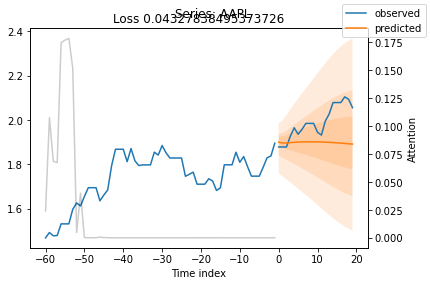

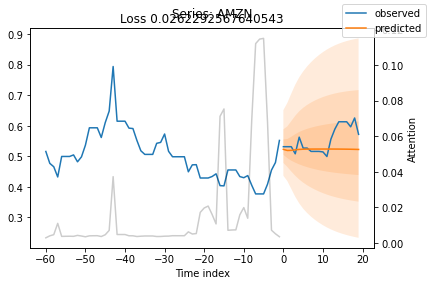

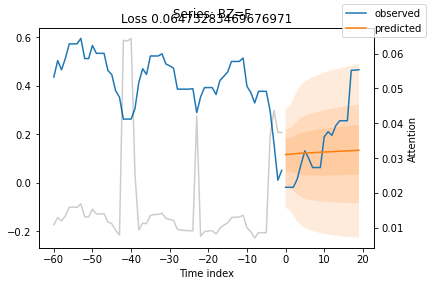

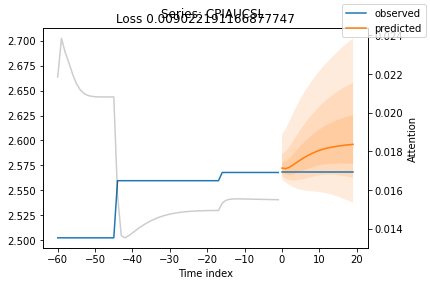

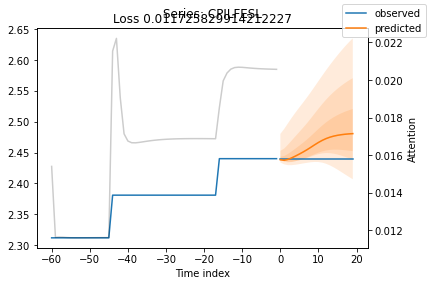

...

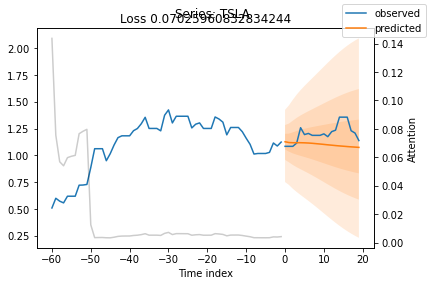

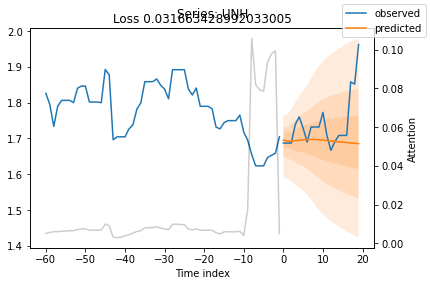

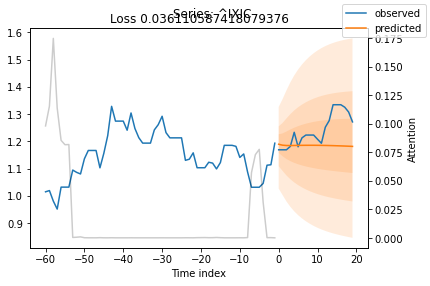

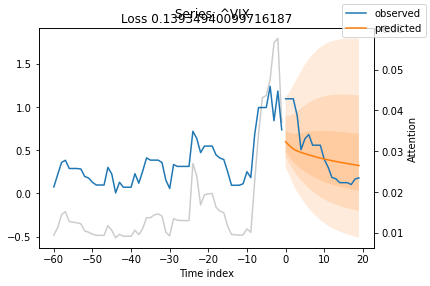

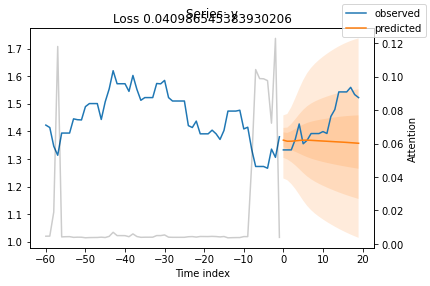

In [124]:
for idx in range(21):  # plot 10 examples
    best_tft.plot_prediction(raw_predictions.x, raw_predictions.output, idx=idx, add_loss_to_title=True)
    plt.suptitle(f"Series: {series.iloc[idx]}")


## N-Beats

In [9]:
train_series.head()

,date,series,value,time_idx
0,2012-05-18,y,-1.527297,0
1,2012-05-19,y,-1.527297,1
2,2012-05-20,y,-1.527297,2
3,2012-05-21,y,-1.504635,3
4,2012-05-22,y,-1.503937,4


In [12]:
import os
import warnings

warnings.filterwarnings("ignore")

import lightning.pytorch as pl
from lightning.pytorch.callbacks import EarlyStopping
import pandas as pd
import torch

from pytorch_forecasting import Baseline, NBeats, TimeSeriesDataSet
from pytorch_forecasting.data import NaNLabelEncoder
from pytorch_forecasting.data.examples import generate_ar_data
from pytorch_forecasting.metrics import SMAPE

In [15]:
# create dataset and dataloaders
max_encoder_length = 60
max_prediction_length = 20

training_cutoff = train_series["time_idx"].max() - max_prediction_length

context_length = max_encoder_length
prediction_length = max_prediction_length

training = TimeSeriesDataSet(
    train_series[lambda x: x.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="value",
    categorical_encoders={"series": NaNLabelEncoder().fit(train_series.series)},
    group_ids=["series"],
    # only unknown variable is "value" - and N-Beats can also not take any additional variables
    time_varying_unknown_reals=["value"],
    max_encoder_length=context_length,
    max_prediction_length=prediction_length,
)

validation = TimeSeriesDataSet.from_dataset(training, train_series, min_prediction_idx=training_cutoff + 1)
batch_size = 128
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size, num_workers=0)

In [18]:
# calculate baseline absolute error
baseline_predictions = Baseline().predict(val_dataloader, return_y=True)
SMAPE()(baseline_predictions.output, baseline_predictions.y)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3060') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


tensor(0.1543, device='cuda:0')

In [19]:
pl.seed_everything(42)
trainer = pl.Trainer(accelerator="auto", gradient_clip_val=0.01)
net = NBeats.from_dataset(training, learning_rate=3e-2, weight_decay=1e-2, widths=[32, 512], backcast_loss_ratio=0.1)

Global seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


You are using a CUDA device ('NVIDIA GeForce RTX 3060') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
Finding best initial lr: 100%|██████████| 100/100 [00:08<00:00, 12.12it/s]
Learning rate set to 0.025118864315095815
Restoring states from the checkpoint path at C:\Users\User\miad_p\MIAD_proyecto_grado\.lr_find_ffa84e3a-46e1-46a2-a88f-6104c4029d39.ckpt
Restored all states from the checkpoint at C:\Users\User\miad_p\MIAD_proyecto_grado\.lr_find_ffa84e3a-46e1-46a2-a88f-6104c4029d39.ckpt


suggested learning rate: 0.025118864315095815


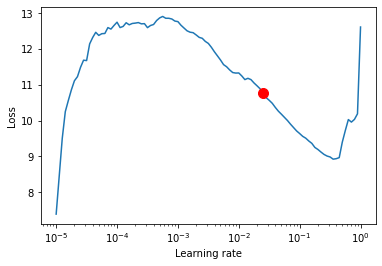

In [20]:
# find optimal learning rate
from lightning.pytorch.tuner import Tuner

res = Tuner(trainer).lr_find(net, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader, min_lr=1e-5)
print(f"suggested learning rate: {res.suggestion()}")
fig = res.plot(show=True, suggest=True)
fig.show()
net.hparams.learning_rate = res.suggestion()

In [21]:
early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=False, mode="min")
trainer = pl.Trainer(
    max_epochs=3,
    accelerator="gpu",
    enable_model_summary=True,
    gradient_clip_val=0.01,
    callbacks=[early_stop_callback],
    limit_train_batches=150,
)


net = NBeats.from_dataset(
    training,
    learning_rate=1e-3,
    log_interval=10,
    log_val_interval=1,
    weight_decay=1e-2,
    widths=[32, 512],
    backcast_loss_ratio=1.0,
)

trainer.fit(
    net,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3060') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type       | Params
-----------------------------------------------
0 | loss            | MASE       | 0     
1 | logging_metrics | ModuleList | 0     
2 | net_blocks      | ModuleList | 1.7 M 
-----------------------------------------------
1.7 M     Trainable params
0         Non-trainable params
1.7 M     Total params
6.851     Total estimated model params size (MB)


Epoch 0: 100%|██████████| 150/150 [00:14<00:00, 10.31it/s, v_num=19, train_loss_step=5.630]
Validation: 0it [00:00, ?it/s]
Epoch 1: 100%|██████████| 150/150 [00:13<00:00, 10.77it/s, v_num=19, train_loss_step=5.400, val_loss=5.520, train_loss_epoch=8.310]
Validation: 0it [00:00, ?it/s]
Epoch 2: 100%|██████████| 150/150 [00:13<00:00, 10.93it/s, v_num=19, train_loss_step=4.110, val_loss=4.420, train_loss_epoch=5.590]
Validation: 0it [00:00, ?it/s]
Epoch 2: 100%|██████████| 150/150 [00:13<00:00, 10.79it/s, v_num=19, train_loss_step=4.110, val_loss=4.130, train_loss_epoch=5.180]

`Trainer.fit` stopped: `max_epochs=3` reached.


Epoch 2: 100%|██████████| 150/150 [00:14<00:00, 10.71it/s, v_num=19, train_loss_step=4.110, val_loss=4.130, train_loss_epoch=5.180]


In [22]:
best_model_path = trainer.checkpoint_callback.best_model_path
best_model = NBeats.load_from_checkpoint(best_model_path)

In [28]:
predictions = best_model.predict(val_dataloader, trainer_kwargs=dict(accelerator="cpu"), return_y=True)
SMAPE()(predictions.output, predictions.y)

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


tensor(0.1456)

In [37]:
# raw_predictions = best_model.predict(
#     val_dataloader, mode="raw", return_x=True, trainer_kwargs=dict(accelerator="cpu")
# )

raw_predictions = best_model.predict(
    val_dataloader, mode="raw", return_x=True, trainer_kwargs=dict(accelerator="cpu")
)

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


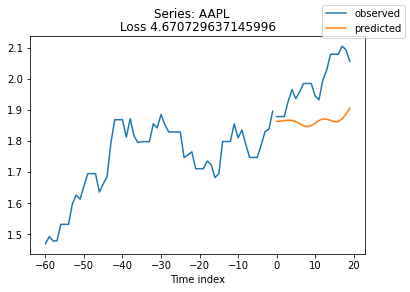

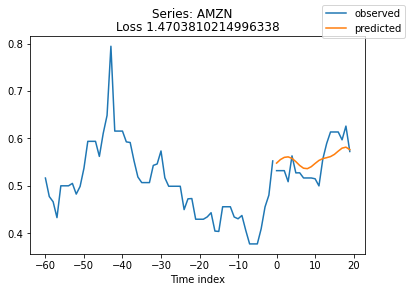

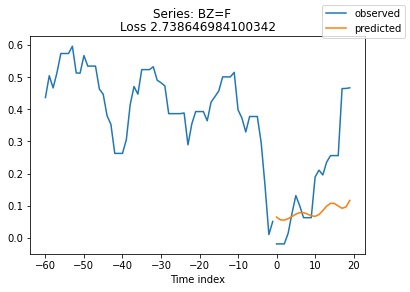

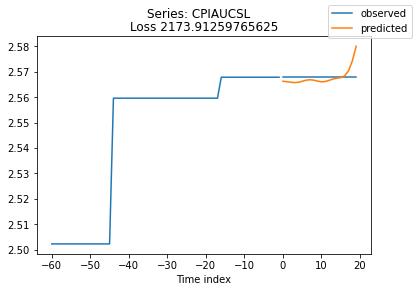

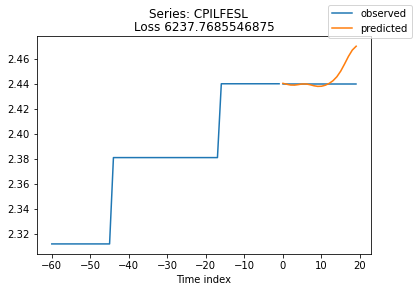

...

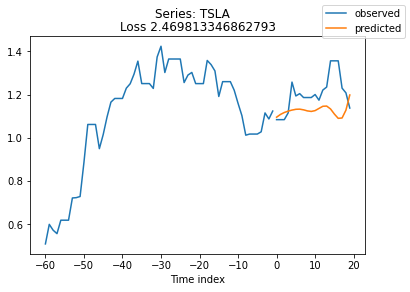

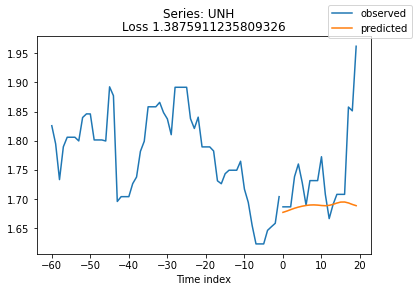

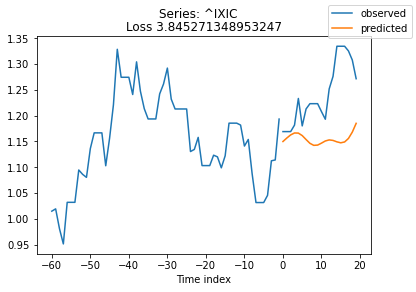

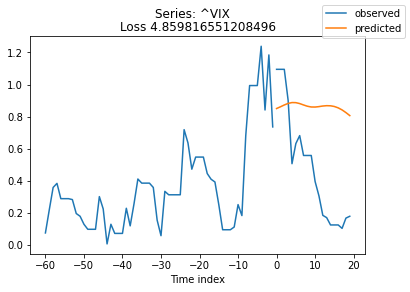

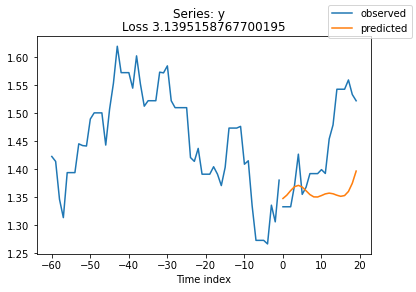

In [38]:

series = validation.x_to_index(raw_predictions.x)["series"]
for idx in range(21):  # plot 10 examples
    best_model.plot_prediction(raw_predictions.x, raw_predictions.output, idx=idx, add_loss_to_title=True)
    plt.suptitle(f"Series: {series.iloc[idx]}")
    

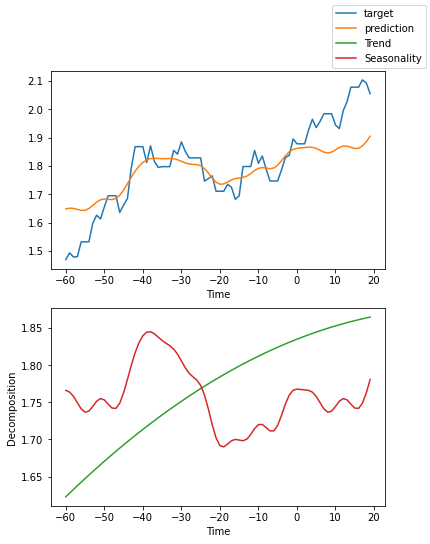

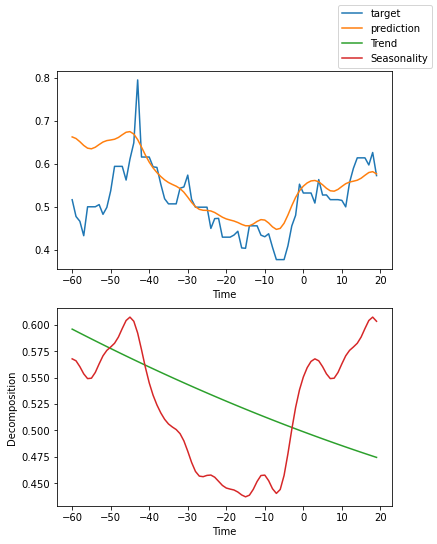

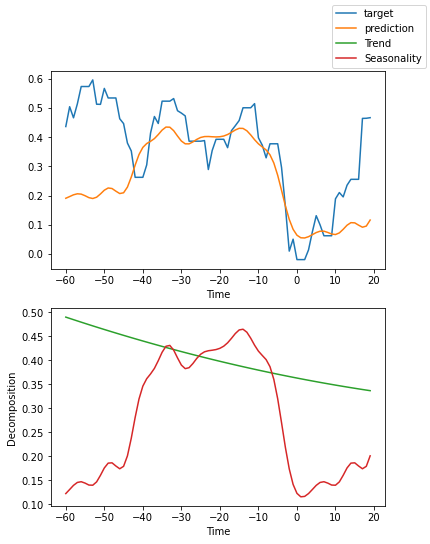

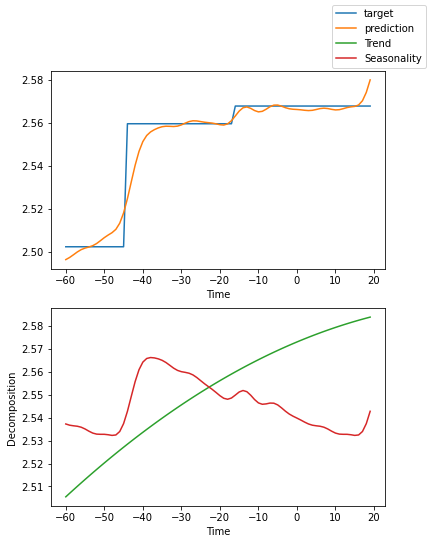

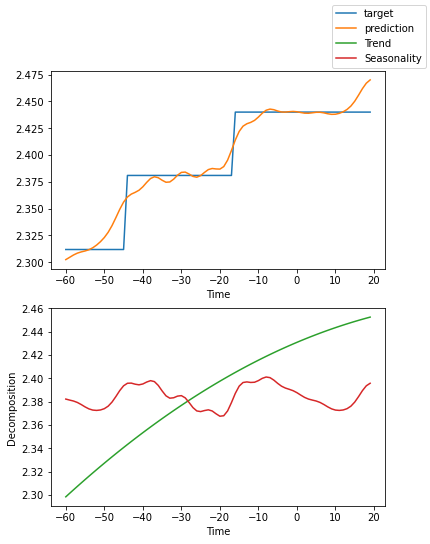

...

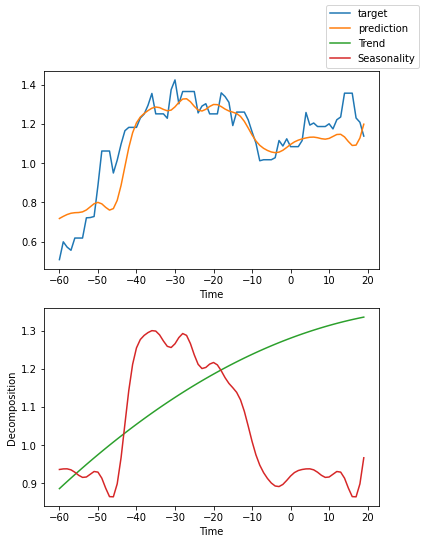

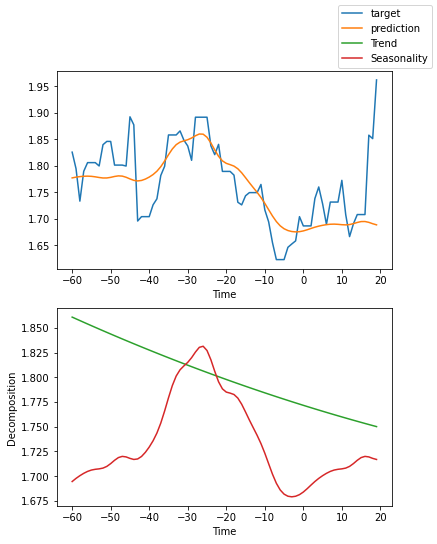

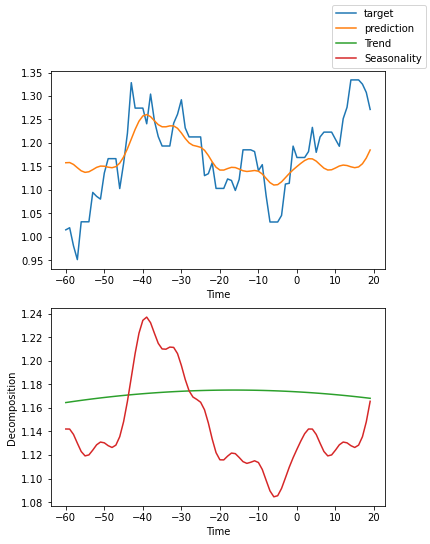

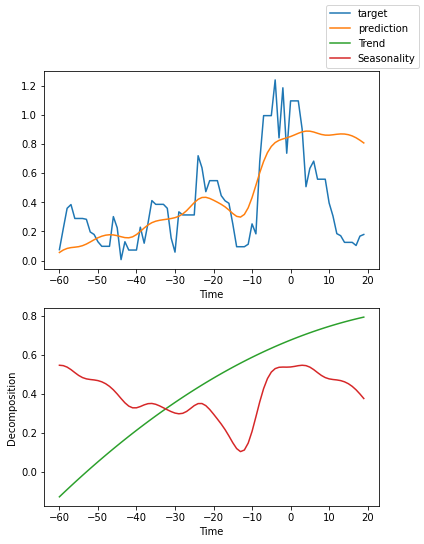

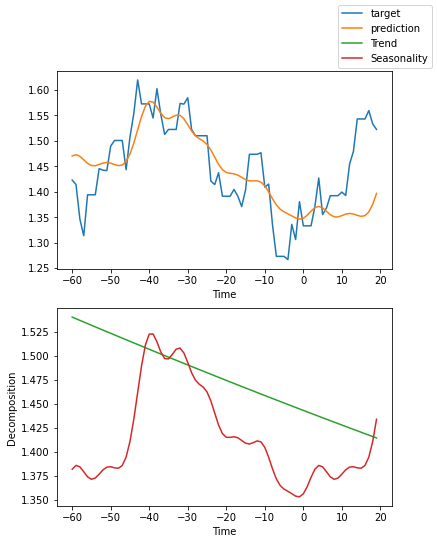

In [40]:
for idx in range(21):  # plot 10 examples
    best_model.plot_interpretation(raw_predictions.x, raw_predictions.output, idx=idx)

### N-HiTS

In [41]:
import lightning.pytorch as pl
from lightning.pytorch.callbacks import EarlyStopping
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch

from pytorch_forecasting import Baseline, NHiTS, TimeSeriesDataSet
from pytorch_forecasting.data import NaNLabelEncoder
from pytorch_forecasting.data.examples import generate_ar_data
from pytorch_forecasting.metrics import MAE, SMAPE, MQF2DistributionLoss, QuantileLoss

In [43]:
# create dataset and dataloaders
max_encoder_length = 60
max_prediction_length = 20

training_cutoff = train_series["time_idx"].max() - max_prediction_length

context_length = max_encoder_length
prediction_length = max_prediction_length

training = TimeSeriesDataSet(
    train_series[lambda x: x.time_idx <= training_cutoff],
    time_idx="time_idx",
    target="value",
    categorical_encoders={"series": NaNLabelEncoder().fit(train_series.series)},
    group_ids=["series"],
    # only unknown variable is "value" - and N-HiTS can also not take any additional variables
    time_varying_unknown_reals=["value"],
    max_encoder_length=context_length,
    max_prediction_length=prediction_length,
)

validation = TimeSeriesDataSet.from_dataset(training, train_series, min_prediction_idx=training_cutoff + 1)
batch_size = 128
train_dataloader = training.to_dataloader(train=True, batch_size=batch_size, num_workers=0)
val_dataloader = validation.to_dataloader(train=False, batch_size=batch_size, num_workers=0)

In [44]:
# calculate baseline absolute error
baseline_predictions = Baseline().predict(val_dataloader, trainer_kwargs=dict(accelerator="cpu"), return_y=True)
SMAPE()(baseline_predictions.output, baseline_predictions.y)

GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


tensor(0.1543)

In [46]:
pl.seed_everything(42)
trainer = pl.Trainer(accelerator="cpu", gradient_clip_val=0.1)
net = NHiTS.from_dataset(
    training,
    learning_rate=3e-2,
    weight_decay=1e-2,
    loss=MQF2DistributionLoss(prediction_length=max_prediction_length),
    backcast_loss_ratio=0.0,
    hidden_size=64,
    optimizer="AdamW",
)

Global seed set to 42
GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Finding best initial lr: 100%|██████████| 100/100 [00:15<00:00,  6.27it/s]
Learning rate set to 0.002290867652767773
Restoring states from the checkpoint path at C:\Users\User\miad_p\MIAD_proyecto_grado\.lr_find_11e84570-9caf-412d-8fd0-2e8d85583dab.ckpt
Restored all states from the checkpoint at C:\Users\User\miad_p\MIAD_proyecto_grado\.lr_find_11e84570-9caf-412d-8fd0-2e8d85583dab.ckpt


suggested learning rate: 0.002290867652767773


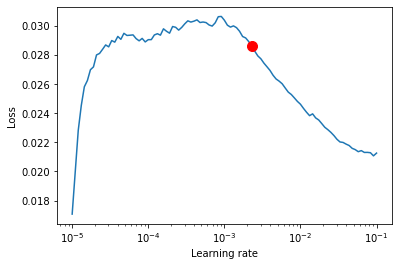

In [47]:
# find optimal learning rate
from lightning.pytorch.tuner import Tuner

res = Tuner(trainer).lr_find(
    net, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader, min_lr=1e-5, max_lr=1e-1
)
print(f"suggested learning rate: {res.suggestion()}")
fig = res.plot(show=True, suggest=True)
fig.show()
net.hparams.learning_rate = res.suggestion()

In [48]:
early_stop_callback = EarlyStopping(monitor="val_loss", min_delta=1e-4, patience=10, verbose=False, mode="min")
trainer = pl.Trainer(
    max_epochs=5,
    accelerator="gpu",
    enable_model_summary=True,
    gradient_clip_val=1.0,
    callbacks=[early_stop_callback],
    limit_train_batches=30,
    enable_checkpointing=True,
)


net = NHiTS.from_dataset(
    training,
    learning_rate=5e-3,
    log_interval=10,
    log_val_interval=1,
    weight_decay=1e-2,
    backcast_loss_ratio=0.0,
    hidden_size=64,
    optimizer="AdamW",
    loss=MQF2DistributionLoss(prediction_length=max_prediction_length),
)

trainer.fit(
    net,
    train_dataloaders=train_dataloader,
    val_dataloaders=val_dataloader,
)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3060') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                 | Params
---------------------------------------------------------
0 | loss            | MQF2DistributionLoss | 5.1 K 
1 | logging_metrics | ModuleList           | 0     
2 | embeddings      | MultiEmbedding       | 0     
3 | model           | NHiTS                | 35.7 K
---------------------------------------------------------
40.8 K    Trainable params
0         Non-trainable params
40.8 K 

Epoch 0: 100%|██████████| 30/30 [00:03<00:00,  8.17it/s, v_num=33, train_loss_step=0.0148]
Validation: 0it [00:00, ?it/s]
Epoch 1: 100%|██████████| 30/30 [00:03<00:00,  8.30it/s, v_num=33, train_loss_step=0.0141, val_loss=0.0207, train_loss_epoch=0.0193]
Validation: 0it [00:00, ?it/s]
Epoch 2: 100%|██████████| 30/30 [00:03<00:00,  7.52it/s, v_num=33, train_loss_step=0.0117, val_loss=0.0215, train_loss_epoch=0.0153]
Validation: 0it [00:00, ?it/s]
Epoch 3: 100%|██████████| 30/30 [00:03<00:00,  8.20it/s, v_num=33, train_loss_step=0.0138, val_loss=0.0191, train_loss_epoch=0.0144]
Validation: 0it [00:00, ?it/s]
Epoch 4: 100%|██████████| 30/30 [00:03<00:00,  7.84it/s, v_num=33, train_loss_step=0.0171, val_loss=0.0211, train_loss_epoch=0.0146]
Validation: 0it [00:00, ?it/s]
Epoch 4: 100%|██████████| 30/30 [00:04<00:00,  7.36it/s, v_num=33, train_loss_step=0.0171, val_loss=0.0189, train_loss_epoch=0.0143]

`Trainer.fit` stopped: `max_epochs=5` reached.


Epoch 4: 100%|██████████| 30/30 [00:04<00:00,  7.30it/s, v_num=33, train_loss_step=0.0171, val_loss=0.0189, train_loss_epoch=0.0143]


In [49]:
best_model_path = trainer.checkpoint_callback.best_model_path
best_model = NHiTS.load_from_checkpoint(best_model_path)

In [50]:
predictions = best_model.predict(val_dataloader, trainer_kwargs=dict(accelerator="cpu"), return_y=True)
MAE()(predictions.output, predictions.y)


GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


tensor(0.1014)

In [51]:
raw_predictions = best_model.predict(val_dataloader, mode="raw", return_x=True, trainer_kwargs=dict(accelerator="cpu"))


GPU available: True (cuda), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


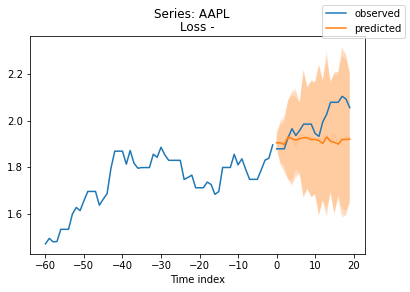

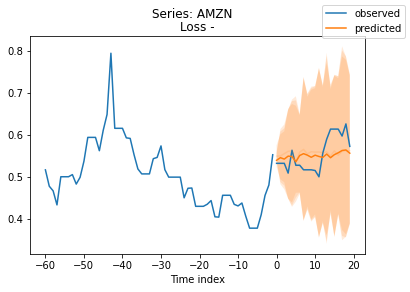

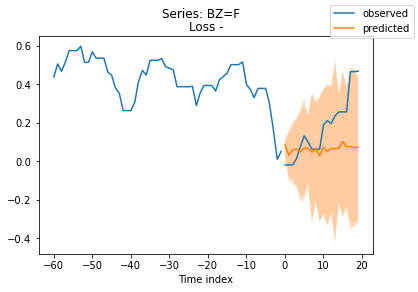

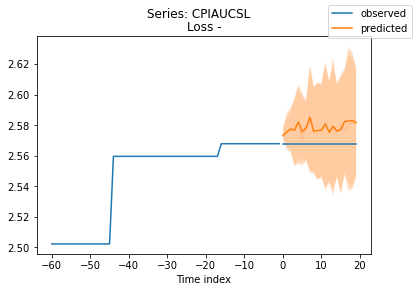

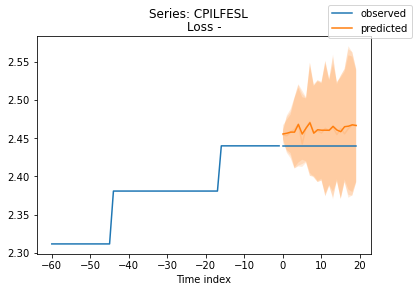

...

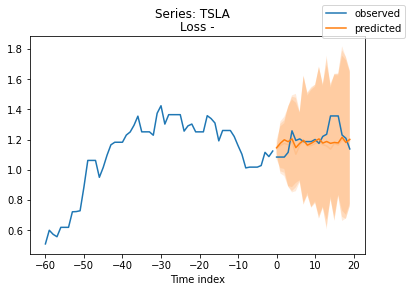

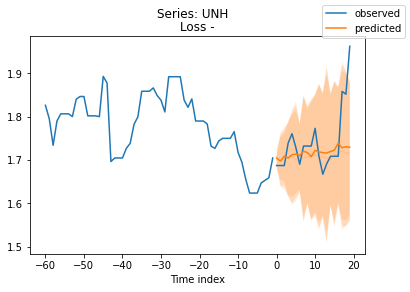

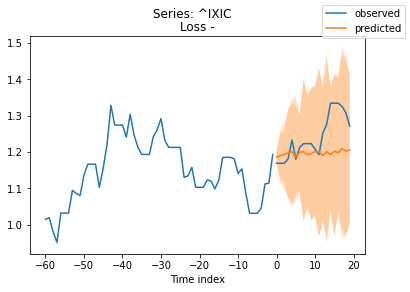

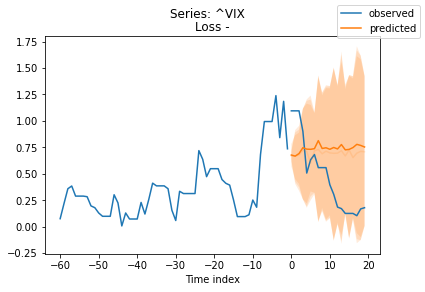

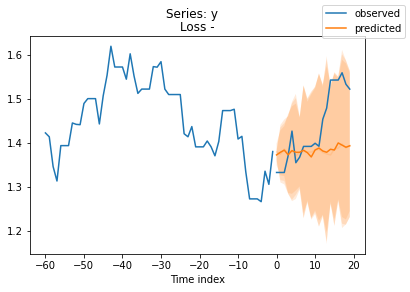

In [54]:
series = validation.x_to_index(raw_predictions.x)["series"]

for idx in range(21):  # plot 10 examples
    best_model.plot_prediction(raw_predictions.x, raw_predictions.output, idx=idx, add_loss_to_title=True)
    plt.suptitle(f"Series: {series.iloc[idx]}")

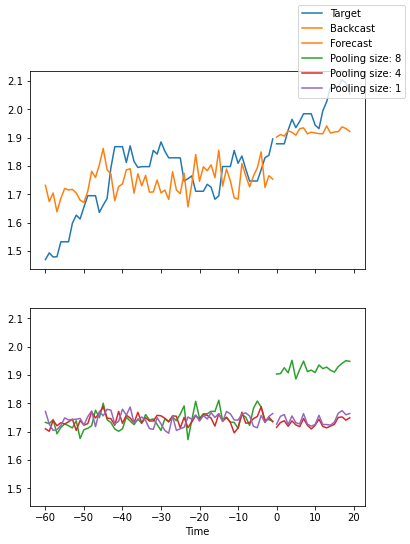

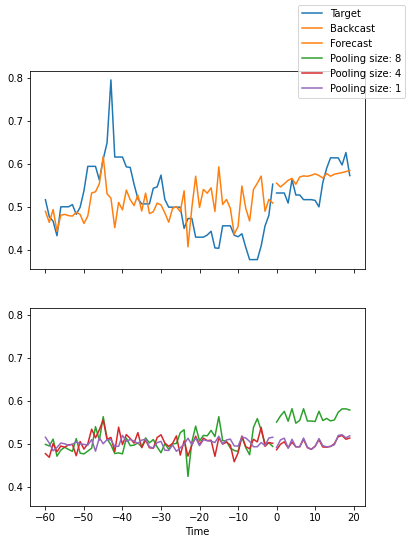

In [55]:
for idx in range(2):  # plot 10 examples
    best_model.plot_interpretation(raw_predictions.x, raw_predictions.output, idx=idx)

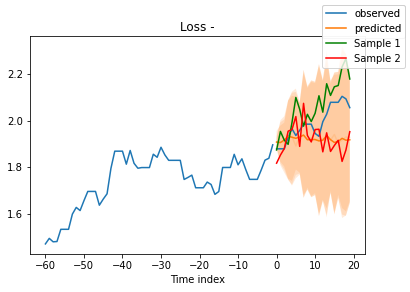

In [56]:
# sample 500 paths
samples = best_model.loss.sample(raw_predictions.output["prediction"][[0]], n_samples=500)[0]

# plot prediction
fig = best_model.plot_prediction(raw_predictions.x, raw_predictions.output, idx=0, add_loss_to_title=True)
ax = fig.get_axes()[0]
# plot first two sampled paths
ax.plot(samples[:, 0], color="g", label="Sample 1")
ax.plot(samples[:, 1], color="r", label="Sample 2")
fig.legend()

In [57]:
print(f"Var(all samples) = {samples.var():.4f}")
print(f"Mean(Var(sample)) = {samples.var(0).mean():.4f}")

Var(all samples) = 0.0144
Mean(Var(sample)) = 0.0052


Text(0, 0.5, 'Frequency')

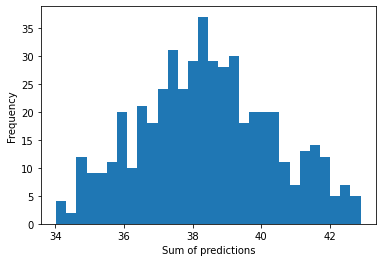

In [58]:
plt.hist(samples.sum(0).numpy(), bins=30)
plt.xlabel("Sum of predictions")
plt.ylabel("Frequency")